In [80]:
import pandas as pd
import numpy as np
import plotly.express as px
from statsmodels.tsa.seasonal import STL
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
calender_data = pd.read_csv('./data/m5-forecasting-accuracy/calendar.csv')
sales_data = pd.read_csv('./data/m5-forecasting-accuracy/sales_train_validation.csv')
price_data = pd.read_csv('./data/m5-forecasting-accuracy/sell_prices.csv')

In [3]:
print(calender_data.shape, sales_data.shape, price_data.shape)

(1969, 14) (30490, 1919) (6841121, 4)


In [4]:
calender_data.head()

,date,wm_yr_wk,weekday,wday,month,year,d,event_name_1,event_type_1,event_name_2,event_type_2,snap_CA,snap_TX,snap_WI
0,2011-01-29,11101,Saturday,1,1,2011,d_1,NaN,NaN,NaN,NaN,0,0,0
1,2011-01-30,11101,Sunday,2,1,2011,d_2,NaN,NaN,NaN,NaN,0,0,0
2,2011-01-31,11101,Monday,3,1,2011,d_3,NaN,NaN,NaN,NaN,0,0,0
3,2011-02-01,11101,Tuesday,4,2,2011,d_4,NaN,NaN,NaN,NaN,1,1,0
4,2011-02-02,11101,Wednesday,5,2,2011,d_5,NaN,NaN,NaN,NaN,1,0,1


In [5]:
calender_data.columns

Index(['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'd',
       'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2',
       'snap_CA', 'snap_TX', 'snap_WI'],
      dtype='object')

In [6]:
sales_data.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d_1,d_2,d_3,d_4,...,d_1904,d_1905,d_1906,d_1907,d_1908,d_1909,d_1910,d_1911,d_1912,d_1913
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,3,0,1,1,1,3,0,1,1
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,2,1,1,1,0,1,1,1
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,1,0,5,4,1,0,1,3,7,2
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,0,0,0,...,2,1,1,0,1,1,2,2,2,4


In [7]:
sales_data.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'd_1',
       'd_2', 'd_3', 'd_4',
       ...
       'd_1904', 'd_1905', 'd_1906', 'd_1907', 'd_1908', 'd_1909', 'd_1910',
       'd_1911', 'd_1912', 'd_1913'],
      dtype='object', length=1919)

In [8]:
sales_data['item_id'].unique(), sales_data['item_id'].unique().shape

(array(['HOBBIES_1_001', 'HOBBIES_1_002', 'HOBBIES_1_003', ...,
        'FOODS_3_825', 'FOODS_3_826', 'FOODS_3_827'], dtype=object),
 (3049,))

In [9]:
sales_data['store_id'].unique(), sales_data['store_id'].unique().shape

(array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
        'WI_2', 'WI_3'], dtype=object),
 (10,))

In [10]:
price_data['item_id'].unique(), price_data['item_id'].unique().shape

(array(['HOBBIES_1_001', 'HOBBIES_1_002', 'HOBBIES_1_003', ...,
        'FOODS_3_825', 'FOODS_3_826', 'FOODS_3_827'], dtype=object),
 (3049,))

In [11]:
price_data['store_id'].unique(), price_data['store_id'].unique().shape

(array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
        'WI_2', 'WI_3'], dtype=object),
 (10,))

In [12]:
price_data.shape

(6841121, 4)

In [13]:
# 使用 melt() 转换格式
sales_long = pd.melt(
    sales_data,
    id_vars=['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id'],
    value_vars=[f'd_{i}' for i in range(1, 1914)],  # 所有日期列
    var_name='d',       # 日期标识（d_1, d_2...）
    value_name='sales'  # 销量值
)

In [14]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0


In [15]:
sales_long.shape

(58327370, 8)

In [16]:
# 合并日历数据：将 d 转换为实际日期
sales_long = sales_long.merge(
    calender_data[['d', 'date', 'wm_yr_wk', 'event_name_1', 'snap_CA', 'snap_TX', 'snap_WI']],
    on='d',
    how='left'
)

In [17]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,d,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,NaN,0,0,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,NaN,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,NaN,0,0,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,NaN,0,0,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,d_1,0,2011-01-29,11101,NaN,0,0,0


In [18]:
# 删除原始的 d 列（保留 date）
sales_long.drop('d', axis=1, inplace=True)

In [19]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0


In [20]:
# 合并价格数据（按周匹配）
sales_long = sales_long.merge(
    price_data,
    on=['store_id', 'item_id', 'wm_yr_wk'],
    how='left'
)

In [20]:
sales_long.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'sales',
       'date', 'wm_yr_wk', 'event_name_1', 'snap_CA', 'snap_TX', 'snap_WI',
       'sell_price'],
      dtype='object')

In [34]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI,sell_price
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN


In [21]:
# 检查缺失值
sales_long['sell_price'].isnull().sum()

12299413

In [24]:
sales_long.shape

(58327370, 14)

In [25]:
sales_long['date'] = pd.to_datetime(sales_long['date'])

In [26]:
# 提取时间特征
sales_long['year'] = sales_long['date'].dt.year
sales_long['month'] = sales_long['date'].dt.month
sales_long['day'] = sales_long['date'].dt.day
sales_long['weekday'] = sales_long['date'].dt.weekday

In [27]:
sales_long.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58327370 entries, 0 to 58327369
Data columns (total 18 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            object        
 1   item_id       object        
 2   dept_id       object        
 3   cat_id        object        
 4   store_id      object        
 5   state_id      object        
 6   sales         int64         
 7   date          datetime64[ns]
 8   wm_yr_wk      int64         
 9   event_name_1  object        
 10  snap_CA       int64         
 11  snap_TX       int64         
 12  snap_WI       int64         
 13  sell_price    float64       
 14  year          int32         
 15  month         int32         
 16  day           int32         
 17  weekday       int32         
dtypes: datetime64[ns](1), float64(1), int32(4), int64(5), object(7)
memory usage: 7.0+ GB


In [28]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI,sell_price,year,month,day,weekday
0,HOBBIES_1_001_CA_1_validation,HOBBIES_1_001,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5
1,HOBBIES_1_002_CA_1_validation,HOBBIES_1_002,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5
2,HOBBIES_1_003_CA_1_validation,HOBBIES_1_003,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5
3,HOBBIES_1_004_CA_1_validation,HOBBIES_1_004,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5
4,HOBBIES_1_005_CA_1_validation,HOBBIES_1_005,HOBBIES_1,HOBBIES,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5


In [29]:
sales_long.to_csv('./data/m5-forecasting-accuracy/m5_processed.csv', index=False)

In [30]:
sales_long['item_id'].unique()

array(['HOBBIES_1_001', 'HOBBIES_1_002', 'HOBBIES_1_003', ...,
       'FOODS_3_825', 'FOODS_3_826', 'FOODS_3_827'], dtype=object)

In [31]:
sales_long['dept_id'].unique()

array(['HOBBIES_1', 'HOBBIES_2', 'HOUSEHOLD_1', 'HOUSEHOLD_2', 'FOODS_1',
       'FOODS_2', 'FOODS_3'], dtype=object)

In [32]:
sales_long['cat_id'].unique()

array(['HOBBIES', 'HOUSEHOLD', 'FOODS'], dtype=object)

In [34]:
sales_long[sales_long['dept_id']=='FOODS_1'].shape

(4132080, 18)

In [35]:
sales_long = sales_long[sales_long['cat_id']=='FOODS']

In [36]:
sales_long.info()

<class 'pandas.core.frame.DataFrame'>
Index: 27489810 entries, 1612 to 58327369
Data columns (total 18 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            object        
 1   item_id       object        
 2   dept_id       object        
 3   cat_id        object        
 4   store_id      object        
 5   state_id      object        
 6   sales         int64         
 7   date          datetime64[ns]
 8   wm_yr_wk      int64         
 9   event_name_1  object        
 10  snap_CA       int64         
 11  snap_TX       int64         
 12  snap_WI       int64         
 13  sell_price    float64       
 14  year          int32         
 15  month         int32         
 16  day           int32         
 17  weekday       int32         
dtypes: datetime64[ns](1), float64(1), int32(4), int64(5), object(7)
memory usage: 3.5+ GB


In [37]:
sales_long.to_csv('./data/m5-forecasting-accuracy/m5_processed_foods.csv', index=False)

In [38]:
sales_long = sales_long[sales_long['dept_id']=='FOODS_1']

In [39]:
sales_long.to_csv('./data/m5-forecasting-accuracy/m5_processed_foods_1.csv', index=False)

In [40]:
sales_long.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4132080 entries, 1612 to 58326148
Data columns (total 18 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            object        
 1   item_id       object        
 2   dept_id       object        
 3   cat_id        object        
 4   store_id      object        
 5   state_id      object        
 6   sales         int64         
 7   date          datetime64[ns]
 8   wm_yr_wk      int64         
 9   event_name_1  object        
 10  snap_CA       int64         
 11  snap_TX       int64         
 12  snap_WI       int64         
 13  sell_price    float64       
 14  year          int32         
 15  month         int32         
 16  day           int32         
 17  weekday       int32         
dtypes: datetime64[ns](1), float64(1), int32(4), int64(5), object(7)
memory usage: 535.9+ MB


In [41]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI,sell_price,year,month,day,weekday
1612,FOODS_1_001_CA_1_validation,FOODS_1_001,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,0,0,0,2.00,2011,1,29,5
1613,FOODS_1_002_CA_1_validation,FOODS_1_002,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,7.88,2011,1,29,5
1614,FOODS_1_003_CA_1_validation,FOODS_1_003,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,2.88,2011,1,29,5
1615,FOODS_1_004_CA_1_validation,FOODS_1_004,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,NaN,2011,1,29,5
1616,FOODS_1_005_CA_1_validation,FOODS_1_005,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,0,0,0,2.94,2011,1,29,5


In [44]:
sales_long[sales_long['sell_price'].isna()]['sales'].unique()

array([0], dtype=int64)

In [45]:
sales_long = sales_long.dropna(subset=['sell_price'])

In [46]:
sales_long['sell_price'].isna().sum()

0

In [47]:
sales_long.columns

Index(['id', 'item_id', 'dept_id', 'cat_id', 'store_id', 'state_id', 'sales',
       'date', 'wm_yr_wk', 'event_name_1', 'snap_CA', 'snap_TX', 'snap_WI',
       'sell_price', 'year', 'month', 'day', 'weekday'],
      dtype='object')

In [48]:
col_indices = sales_long['state_id'].map({'CA': 0, 'TX': 1, 'WI': 2})

In [49]:
# 提取 snap_CA, snap_TX, snap_WI 的值矩阵
snap_values = sales_long[['snap_CA', 'snap_TX', 'snap_WI']].values

In [54]:
sales_long['snap'] = snap_values[np.arange(len(sales_long)), col_indices]

C:\Users\sheng\AppData\Local\Temp\ipykernel_62528\2824716487.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sales_long['snap'] = snap_values[np.arange(len(sales_long)), col_indices]


In [55]:
sales_long.head()

,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,snap_CA,snap_TX,snap_WI,sell_price,year,month,day,weekday,snap
1612,FOODS_1_001_CA_1_validation,FOODS_1_001,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,0,0,0,2.00,2011,1,29,5,0
1613,FOODS_1_002_CA_1_validation,FOODS_1_002,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,7.88,2011,1,29,5,0
1614,FOODS_1_003_CA_1_validation,FOODS_1_003,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,2.88,2011,1,29,5,0
1616,FOODS_1_005_CA_1_validation,FOODS_1_005,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,0,0,0,2.94,2011,1,29,5,0
1617,FOODS_1_006_CA_1_validation,FOODS_1_006,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,0,0,0,1.97,2011,1,29,5,0


In [56]:
sales_long.to_csv('./data/m5-forecasting-accuracy/m5_processed_foods_1.csv')

In [117]:
sales_long.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3530738 entries, 1612 to 58326148
Data columns (total 19 columns):
 #   Column        Dtype         
---  ------        -----         
 0   id            object        
 1   item_id       object        
 2   dept_id       object        
 3   cat_id        object        
 4   store_id      object        
 5   state_id      object        
 6   sales         int64         
 7   date          datetime64[ns]
 8   wm_yr_wk      int64         
 9   event_name_1  object        
 10  snap_CA       int64         
 11  snap_TX       int64         
 12  snap_WI       int64         
 13  sell_price    float64       
 14  year          int32         
 15  month         int32         
 16  day           int32         
 17  weekday       int32         
 18  snap          int64         
dtypes: datetime64[ns](1), float64(1), int32(4), int64(6), object(7)
memory usage: 484.9+ MB


---

In [127]:
sales_long = pd.read_csv('./data/m5-forecasting-accuracy/m5_processed_foods_1.csv')

C:\Users\sheng\AppData\Local\Temp\ipykernel_62528\4048893650.py:1: DtypeWarning:

Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.



In [128]:
sales_long = sales_long.drop(['snap_CA', 'snap_TX', 'snap_WI'], axis=1)

In [129]:
sales_long.head()

,Unnamed: 0,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,sell_price,year,month,day,weekday,snap
0,1612,FOODS_1_001_CA_1_validation,FOODS_1_001,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,2.00,2011,1,29,5,0
1,1613,FOODS_1_002_CA_1_validation,FOODS_1_002,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,7.88,2011,1,29,5,0
2,1614,FOODS_1_003_CA_1_validation,FOODS_1_003,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,2.88,2011,1,29,5,0
3,1616,FOODS_1_005_CA_1_validation,FOODS_1_005,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,2.94,2011,1,29,5,0
4,1617,FOODS_1_006_CA_1_validation,FOODS_1_006,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,1.97,2011,1,29,5,0


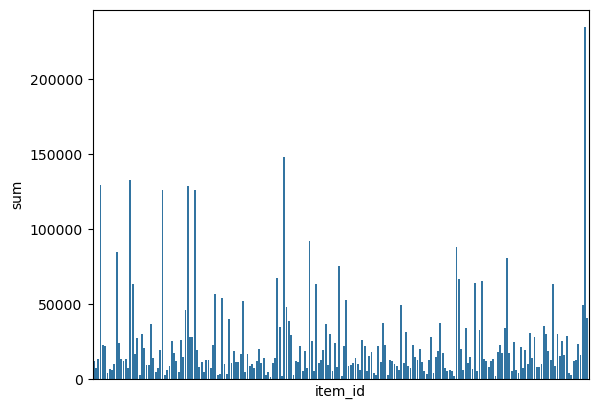

In [136]:
total_sales_stats = sales_long.groupby('item_id')['sales'].agg(['sum'])
sns.barplot(data=total_sales_stats, x='item_id', y='sum')
plt.xticks([])
plt.show()

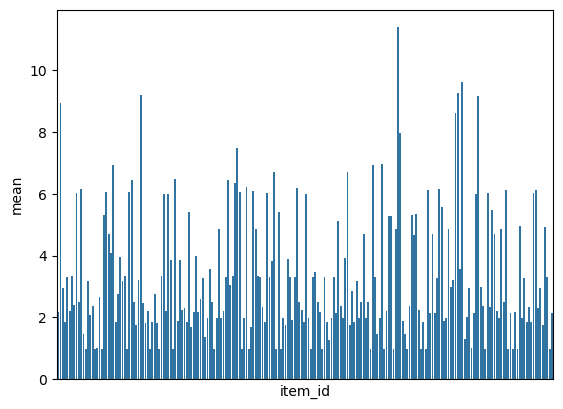

In [138]:
total_price_stats = sales_long.groupby('item_id')['sell_price'].agg(['mean'])
sns.barplot(data=total_price_stats, x='item_id', y='mean')
plt.xticks([])
plt.show()

In [140]:
sales_long['store_id'].unique(), sales_long['store_id'].nunique()

(array(['CA_1', 'CA_2', 'CA_3', 'CA_4', 'TX_1', 'TX_2', 'TX_3', 'WI_1',
        'WI_2', 'WI_3'], dtype=object),
 10)

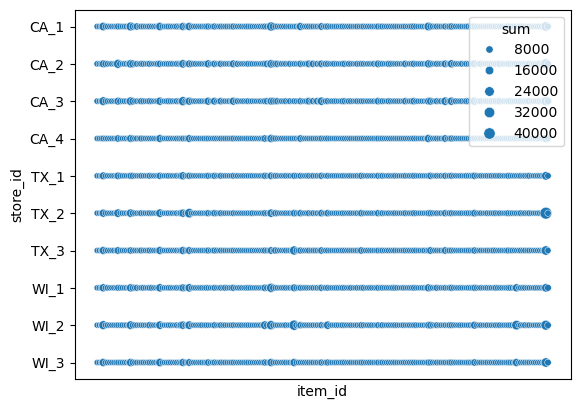

In [149]:
store_sales = sales_long.groupby(['item_id', 'store_id'])['sales'].agg(['sum'])
sns.scatterplot(data=store_sales, x='item_id', y='store_id', size='sum')
plt.xticks([])
plt.show()

In [150]:
sales_long.pivot_table(index='item_id', columns='store_id', values='sales', aggfunc='sum')

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
item_id,,,,,,,,,,
FOODS_1_001,1503,2214,2302,688,1119,1112,785,1086,875,563
FOODS_1_002,914,1154,603,640,323,455,533,1441,632,639
FOODS_1_003,1592,3140,1977,914,877,805,291,2409,709,680
FOODS_1_004,15797,10589,17508,3727,10798,13020,12464,13447,18709,13422
FOODS_1_005,2224,5804,3626,902,1338,2029,1707,1960,1694,1630
...,...,...,...,...,...,...,...,...,...,...
FOODS_1_215,2106,7440,5174,1000,1534,1951,907,1191,1091,935
FOODS_1_216,1485,4455,3235,643,1205,1407,938,1125,899,1014
FOODS_1_217,4024,9826,10788,2005,3489,5461,4557,2951,2577,3580


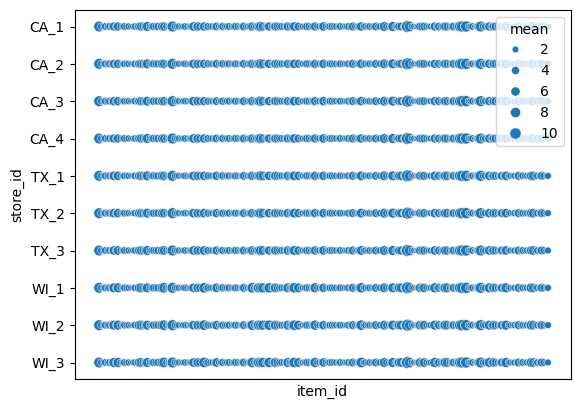

In [152]:
store_price = sales_long.groupby(['item_id', 'store_id'])['sell_price'].agg(['mean'])
sns.scatterplot(data=store_price, x='item_id', y='store_id', size='mean')
plt.xticks([])
plt.show()

In [154]:
sales_long.pivot_table(index='item_id', columns='store_id', values='sell_price', aggfunc='mean')

store_id,CA_1,CA_2,CA_3,CA_4,TX_1,TX_2,TX_3,WI_1,WI_2,WI_3
item_id,,,,,,,,,,
FOODS_1_001,2.167109,2.167109,2.155656,2.167109,2.154997,2.166231,2.166842,2.166231,2.167109,2.164438
FOODS_1_002,8.920146,8.841840,8.917951,8.923806,8.909937,8.921610,8.917951,8.920146,8.972838,8.918683
FOODS_1_003,2.968735,2.968735,2.967454,2.967454,2.966064,2.967454,2.961051,2.968735,2.966174,2.968735
FOODS_1_004,1.847001,1.847834,1.822999,1.847001,1.846539,1.845707,1.847001,1.847001,1.845707,1.846169
FOODS_1_005,3.327914,3.326670,3.263183,3.325646,3.320998,3.316278,3.327914,3.327914,3.358798,3.331258
...,...,...,...,...,...,...,...,...,...,...
FOODS_1_215,1.746541,1.746979,1.745787,1.805802,1.746229,1.746229,1.749147,1.744213,1.748146,1.743979
FOODS_1_216,4.953968,4.950528,4.951992,4.945589,4.917925,4.923889,4.912225,4.952504,4.991170,4.892713
FOODS_1_217,3.327914,3.327914,3.229775,3.327914,3.327914,3.327914,3.327914,3.327914,3.359749,3.327914


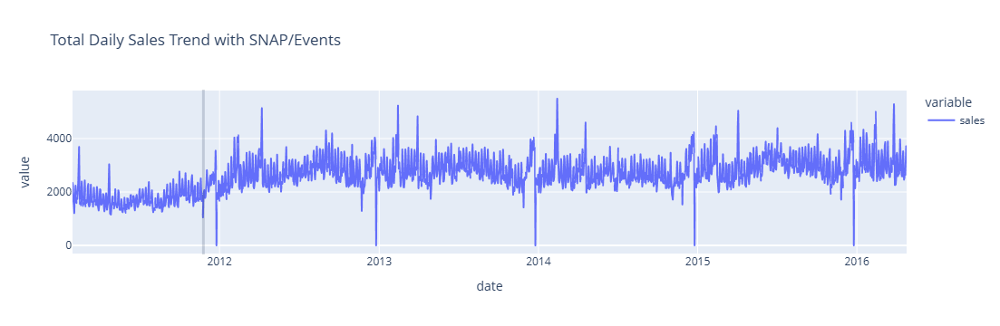

In [160]:
# 2. 时间维度分析

fig = px.line(sales_long.groupby('date')['sales'].sum(), 
              title="Total Daily Sales Trend with SNAP/Events")
fig.add_vrect(x0="2011-11-24", x1="2011-11-26", fillcolor="red", opacity=0.2)  # 事件标注
fig.show()

In [165]:
# 生成交互式趋势诊断报告
def plot_trend_decomposition(item_id):
    item_df = sales_long[sales_long['item_id']==item_id].set_index('date')
    res = STL(item_df['sales'], period=365).fit()
    
    fig = px.line(title=f"Sales Decomposition - {item_id}")
    fig.add_scatter(x=res.trend.index, y=res.trend,name='Trend')
    fig.add_scatter(x=res.seasonal.index, y=res.seasonal, name='Seasonality')
    fig.add_scatter(x=res.resid.index, y=res.resid, name='Residual')
    fig.show()

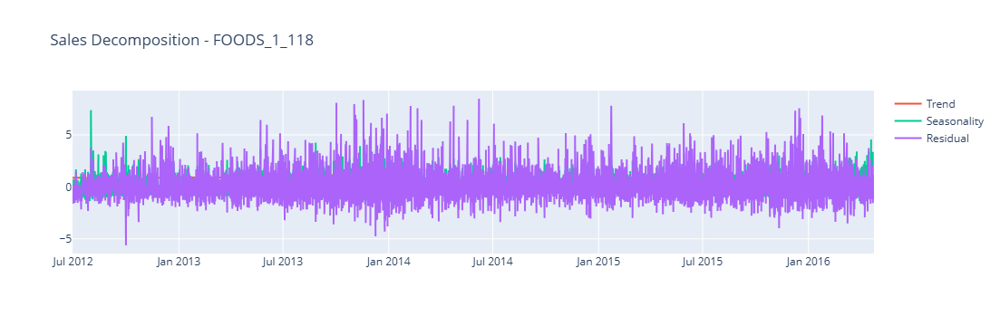

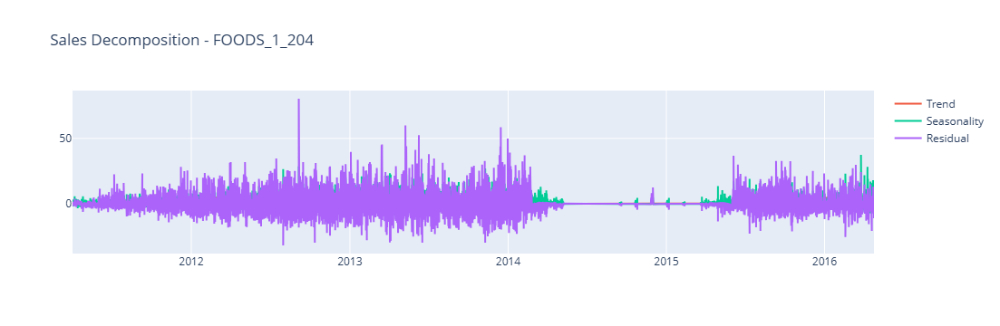

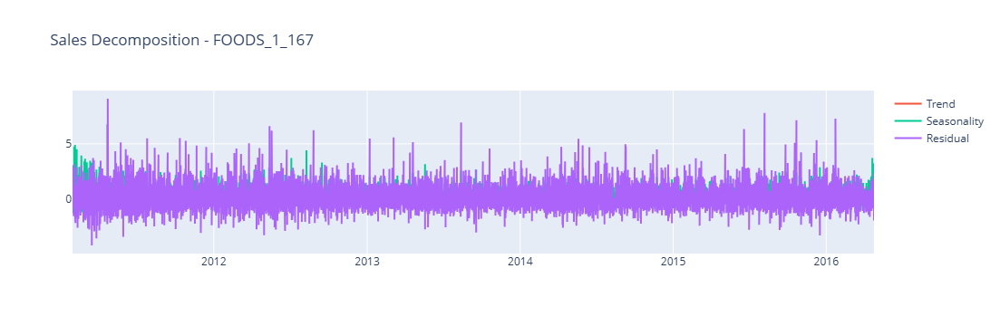

In [166]:
# 随机抽取3个商品生成报告
for item in sales_long['item_id'].sample(3, random_state=42):
    plot_trend_decomposition(item)

In [251]:
# 检测周/月/年季节性
def check_multi_seasonality(ts, lags=90):
    plot_acf(ts, lags=lags, alpha=0.05)
    plt.title(f"Autocorrelation (Lags 0-{lags})")
    plt.ylim(-0.25,1)
    plt.show()

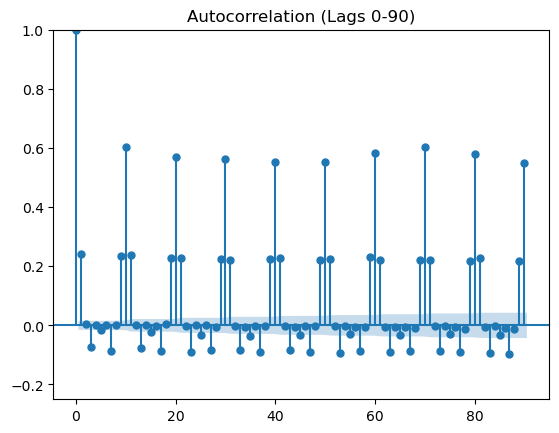

In [252]:
# 对头部商品进行检测
top_item = sales_long.groupby('item_id')['sales'].sum().nlargest(10).index[9]
check_multi_seasonality(sales_long[sales_long['item_id']==top_item].set_index('date')['sales'])

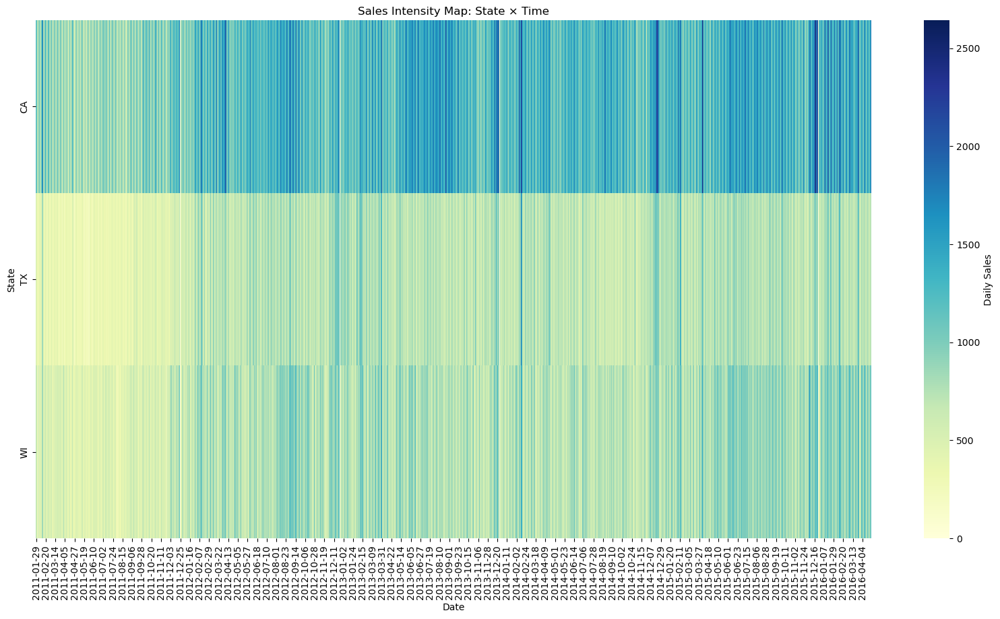

In [189]:
# 创建地理-时间热度矩阵
heatmap_df = sales_long.groupby(['date', 'state_id'])['sales'].sum().unstack()
plt.figure(figsize=(20,10))
sns.heatmap(heatmap_df.T, cmap='YlGnBu', cbar_kws={'label': 'Daily Sales'})
plt.title("Sales Intensity Map: State × Time")
plt.xlabel("Date")
plt.ylabel("State")
plt.show()

C:\miniconda3\envs\data_science\lib\site-packages\sklearn\cluster\_kmeans.py:1419: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.



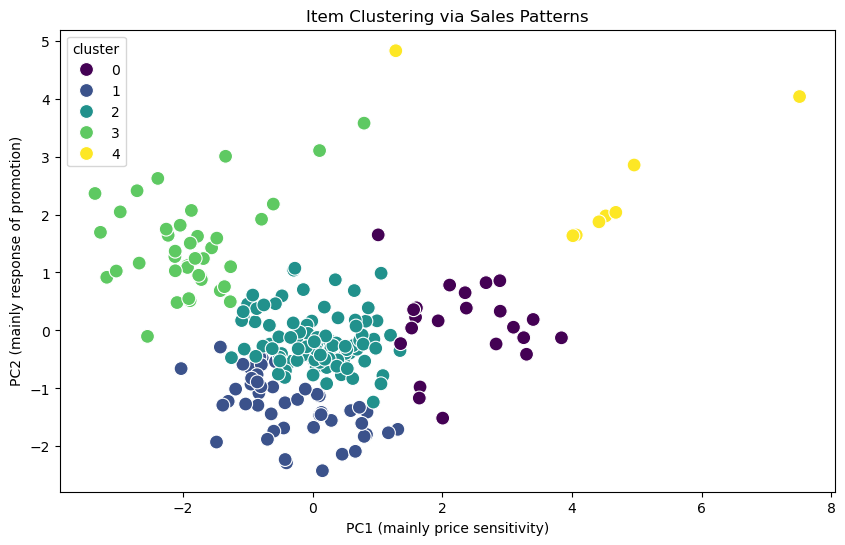

In [92]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# 构建商品特征矩阵
item_features = sales_long.groupby('item_id').agg({
    'sales': ['mean', 'std', 'skew'],
    'sell_price': ['mean', 'std'],
    'snap': 'mean'
}).droplevel(0, axis=1)

# 聚类分析
scaler = StandardScaler()
X = scaler.fit_transform(item_features)
kmeans = KMeans(n_clusters=5, random_state=42).fit(X)
item_features['cluster'] = kmeans.labels_

# 可视化聚类结果（PCA降维）
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
components = pca.fit_transform(X)

plt.figure(figsize=(10,6))
sns.scatterplot(x=components[:,0], y=components[:,1], 
                hue=item_features['cluster'], 
                palette='viridis',
                s=100)
plt.title("Item Clustering via Sales Patterns")
plt.xlabel("PC1 (mainly price sensitivity)")
plt.ylabel("PC2 (mainly response of promotion)")
plt.show()

In [193]:
# 计算SNAP日的销售提升率
snap_effect = sales_long.groupby(['state_id', 'snap'])['sales'].mean().unstack()
snap_effect['lift'] = (snap_effect[1] - snap_effect[0]) / snap_effect[0]

# 统计检验 (t-test)
from scipy.stats import ttest_ind
snap_states_list = ['CA', 'TX', 'WI']
for state in snap_states_list:
    snap_sales = sales_long[sales_long['state_id']==state]
    t_stat, p_val = ttest_ind(
        snap_sales[snap_sales['snap']==1]['sales'],
        snap_sales[snap_sales['snap']==0]['sales'],
        equal_var=False
    )
    print(f"{state}州SNAP效应p值: {p_val:.4f} (提升率: {snap_effect.loc[state, 'lift']:.2%})")

CA州SNAP效应p值: 0.0001 (提升率: 1.39%)
TX州SNAP效应p值: 0.0000 (提升率: 7.82%)
WI州SNAP效应p值: 0.0000 (提升率: 14.09%)


In [94]:
# 构建事件影响报告
event_impact = sales_long.groupby('event_name_1')['sales'].agg(['mean', 'count'])
baseline = sales_long['sales'].mean()
event_impact['lift'] = event_impact['mean'] / baseline - 1

# 筛选显著事件
significant_events = event_impact[event_impact['count']>5].sort_values('lift', ascending=False)
print("Top 3正向影响事件:")
print(significant_events.head(3))

Top 3正向影响事件:
                   mean  count      lift
event_name_1                            
ValentinesDay  2.025188  10640  0.405336
Easter         1.775929   9854  0.232368
Halloween      1.726151   9403  0.197826


In [208]:
top_item = sales_long.groupby('item_id')['sales'].sum().nlargest(1).index[0]
print(f"分析头部商品: {top_item}")

分析头部商品: FOODS_1_218


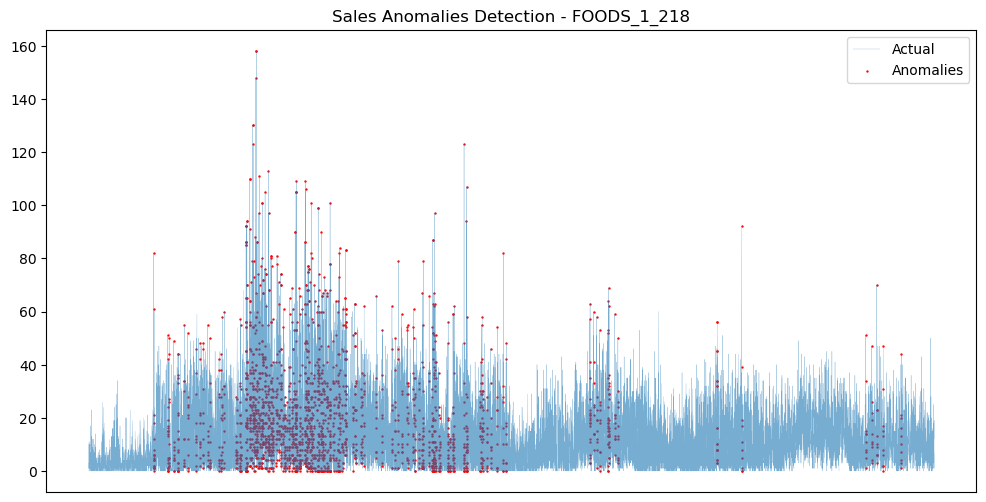

In [236]:
# 使用STL分解检测残差异常
def detect_anomalies(item_id, z_threshold=3):
    item_df = sales_long[sales_long['item_id']==item_id].set_index('date')
    res = STL(item_df['sales'], period=365).fit()
    
    # 计算标准化残差
    resid_zscore = (res.resid - res.resid.mean()) / res.resid.std()
    anomalies = resid_zscore[abs(resid_zscore) > z_threshold]
    
    # 可视化标注
    plt.figure(figsize=(12,6))
    plt.plot(item_df.index, item_df['sales'], label='Actual', linewidth=.2, alpha=.6)
    plt.scatter(item_df.loc[anomalies.index].index, item_df.loc[anomalies.index, 'sales'], 
                color='red', label='Anomalies', s=.5)
    plt.title(f"Sales Anomalies Detection - {item_id}")
    plt.xticks([])
    plt.legend()
    plt.show()
    
    return anomalies

# 检测头部商品异常
top_item_anomalies = detect_anomalies(top_item)

---

In [283]:
sales_long.head()

,Unnamed: 0,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,event_name_1,sell_price,year,month,day,weekday,snap
0,1612,FOODS_1_001_CA_1_validation,FOODS_1_001,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,2.00,2011,1,29,5,0
1,1613,FOODS_1_002_CA_1_validation,FOODS_1_002,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,7.88,2011,1,29,5,0
2,1614,FOODS_1_003_CA_1_validation,FOODS_1_003,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,2.88,2011,1,29,5,0
3,1616,FOODS_1_005_CA_1_validation,FOODS_1_005,FOODS_1,FOODS,CA_1,CA,3,2011-01-29,11101,NaN,2.94,2011,1,29,5,0
4,1617,FOODS_1_006_CA_1_validation,FOODS_1_006,FOODS_1,FOODS,CA_1,CA,0,2011-01-29,11101,NaN,1.97,2011,1,29,5,0


In [310]:
sales_long['date'] = pd.to_datetime(sales_long['date'])

In [311]:
def create_time_features(df):
    """生成简单时间特征"""
    df['is_weekend'] = df['weekday'].isin([5, 6]).astype(int)
    df['week_of_year'] = df['date'].dt.isocalendar().week.astype(int)
    df['day_of_month'] = df['date'].dt.day
    df['is_month_start'] = df['date'].dt.is_month_start.astype(int)
    df['is_month_end'] = df['date'].dt.is_month_end.astype(int)
    return df

In [312]:
def create_lag_features(df, group_cols, target_col='sales', lags=[1, 7, 28]):
    """生成滞后特征"""
    for lag in lags:
        df[f'{target_col}_lag_{lag}'] = df.groupby(group_cols)[target_col].shift(lag)
    return df

In [313]:
def create_fourier_features(df, date_col='date', period_list=[7, 10, 30, 70], order=3):
    """傅里叶级数展开特征"""
    t = (df[date_col] - df[date_col].min()).dt.days
    for period in period_list:
        for k in range(1, order+1):
            df[f'sin_{period}_{k}'] = np.sin(2 * np.pi * k * t / period)
            df[f'cos_{period}_{k}'] = np.cos(2 * np.pi * k * t / period)
    return df

In [314]:
sales_long = create_time_features(sales_long)

In [316]:
sales_long = create_lag_features(sales_long, group_cols=['item_id', 'store_id'])

In [317]:
sales_long = create_fourier_features(sales_long)

In [319]:
sales_long.shape

(3530738, 51)

In [320]:
def create_rolling_features(df, group_cols, target_col='sales', windows=[7, 28]):
    for window in windows:
        df[f'{target_col}_rolling_mean_{window}'] = (
            df.groupby(group_cols)[target_col]
              .transform(lambda x: x.shift(1).rolling(window).mean())
        )
    return df

In [321]:
def create_price_change(df):
    df['price_change'] = df.groupby(['item_id', 'store_id'])['sell_price'].pct_change()
    return df

In [322]:
def create_price_volatility(df, window=7):
    df[f'price_std_{window}'] = (
        df.groupby(['item_id', 'store_id'])['sell_price']
          .transform(lambda x: x.shift(1).rolling(window).std())
    )
    return df

In [339]:
def create_event_window_fast(df, window=3):
    event_dates = df[df['event_name_1'].notna()][['date']].drop_duplicates()
    
    # 构造节日前后window的日期范围
    date_shifts = pd.DataFrame({
        'offset': range(-window, window + 1)
    })

    event_windows = (
        event_dates.assign(key=1).merge(date_shifts.assign(key=1), on='key')
                    .assign(window_date=lambda x: x['date'] + pd.to_timedelta(x['offset'], unit='D'))
                    [['window_date']]
                    .drop_duplicates()
                    .rename(columns={'window_date': 'date'})
    )
    event_windows['in_event_window'] = 1

    # 合并到主表
    df = df.merge(event_windows, on='date', how='left')
    df['in_event_window'] = df['in_event_window'].fillna(0).astype(int)

    return df

In [344]:
def create_event_decay_fast(df, max_decay=5):
    # 获取所有事件日期
    event_dates = df[df['event_name_1'].notna()][['date']].drop_duplicates()

    # 构建 offset + 权重
    decay_offsets = pd.DataFrame({
        'offset': range(-max_decay, max_decay + 1)
    })
    decay_offsets['decay_weight'] = 1 - decay_offsets['offset'].abs() / (max_decay + 1)

    # 构建 event-date ± offset 的所有组合
    decay_df = (
        event_dates.assign(key=1)
        .merge(decay_offsets.assign(key=1), on='key')
        .assign(target_date=lambda x: x['date'] + pd.to_timedelta(x['offset'], unit='D'))
        [['target_date', 'decay_weight']]
        .rename(columns={'target_date': 'date'})
    )

    # 聚合同一天可能多个事件导致的叠加影响
    decay_df = decay_df.groupby('date', as_index=False)['decay_weight'].sum()

    # 合并到主表
    df = df.merge(decay_df, on='date', how='left')
    df['event_decay'] = df['decay_weight'].fillna(0.0)
    df.drop(columns=['decay_weight'], inplace=True)

    return df

In [325]:
def create_region_item_cross(df):
    df['region_item_mean_sales'] = (
        df.groupby(['state_id', 'item_id'])['sales']
          .transform(lambda x: x.shift(1).rolling(28).mean())
    )
    return df

In [326]:
def create_snap_price_interaction(df):
    df['snap_price_effect'] = df['snap'] * df['sell_price']
    return df

In [327]:
def create_snap_state_interaction(df):
    for state in df['state_id'].unique():
        df[f'snap_{state}'] = ((df['state_id'] == state) & (df['snap'] == 1)).astype(int)
    return df

In [328]:
sales_long = create_rolling_features(sales_long, ['item_id', 'store_id'], 'sales', windows=[7, 28])

In [329]:
sales_long = create_price_change(sales_long)

In [330]:
sales_long = create_price_volatility(sales_long, window=7)

In [345]:
sales_long.columns

Index(['Unnamed: 0', 'id', 'item_id', 'dept_id', 'cat_id', 'store_id',
       'state_id', 'sales', 'date', 'wm_yr_wk', 'event_name_1', 'sell_price',
       'year', 'month', 'day', 'weekday', 'snap', 'is_weekend', 'weekofyear',
       'dayofmonth', 'is_month_start', 'is_month_end', 'week_of_year',
       'day_of_month', 'sales_lag_1', 'sales_lag_7', 'sales_lag_28', 'sin_7_1',
       'cos_7_1', 'sin_7_2', 'cos_7_2', 'sin_7_3', 'cos_7_3', 'sin_10_1',
       'cos_10_1', 'sin_10_2', 'cos_10_2', 'sin_10_3', 'cos_10_3', 'sin_30_1',
       'cos_30_1', 'sin_30_2', 'cos_30_2', 'sin_30_3', 'cos_30_3', 'sin_70_1',
       'cos_70_1', 'sin_70_2', 'cos_70_2', 'sin_70_3', 'cos_70_3',
       'sales_rolling_mean_7', 'sales_rolling_mean_28', 'price_change',
       'price_std_7', 'in_event_window'],
      dtype='object')

In [343]:
sales_long = sales_long.drop('event_decay', axis=1)

In [340]:
sales_long = create_event_window_fast(sales_long, window=3)

In [346]:
sales_long = create_event_decay_fast(sales_long, max_decay=5)

In [347]:
sales_long = create_region_item_cross(sales_long)

In [348]:
sales_long = create_snap_price_interaction(sales_long)

In [349]:
sales_long = create_snap_state_interaction(sales_long)

In [350]:
sales_long.columns

Index(['Unnamed: 0', 'id', 'item_id', 'dept_id', 'cat_id', 'store_id',
       'state_id', 'sales', 'date', 'wm_yr_wk', 'event_name_1', 'sell_price',
       'year', 'month', 'day', 'weekday', 'snap', 'is_weekend', 'weekofyear',
       'dayofmonth', 'is_month_start', 'is_month_end', 'week_of_year',
       'day_of_month', 'sales_lag_1', 'sales_lag_7', 'sales_lag_28', 'sin_7_1',
       'cos_7_1', 'sin_7_2', 'cos_7_2', 'sin_7_3', 'cos_7_3', 'sin_10_1',
       'cos_10_1', 'sin_10_2', 'cos_10_2', 'sin_10_3', 'cos_10_3', 'sin_30_1',
       'cos_30_1', 'sin_30_2', 'cos_30_2', 'sin_30_3', 'cos_30_3', 'sin_70_1',
       'cos_70_1', 'sin_70_2', 'cos_70_2', 'sin_70_3', 'cos_70_3',
       'sales_rolling_mean_7', 'sales_rolling_mean_28', 'price_change',
       'price_std_7', 'in_event_window', 'event_decay',
       'region_item_mean_sales', 'snap_price_effect', 'snap_CA', 'snap_TX',
       'snap_WI'],
      dtype='object')

In [351]:
sales_long.shape

(3530738, 62)

In [352]:
sales_long.to_csv('./data/m5-forecasting-accuracy/m5_processed_foods_1_features62.csv')

---

In [353]:
def sample_items(df, frac=0.1, seed=42):
    """从 item_id 中抽取一定比例（10%）的类别子集"""
    unique_items = df['item_id'].unique()
    sampled_items = np.random.RandomState(seed).choice(unique_items, size=int(len(unique_items) * frac), replace=False)
    df_sampled = df[df['item_id'].isin(sampled_items)].copy()
    return df_sampled, sampled_items

In [359]:
sales_long, sampled_items = sample_items(sales_long, frac=0.1, seed=42)

print(f"共抽取了 {len(sampled_items)} 个商品：")
print(sampled_items)

共抽取了 21 个商品：
['FOODS_1_159' 'FOODS_1_122' 'FOODS_1_008' 'FOODS_1_109' 'FOODS_1_040'
 'FOODS_1_128' 'FOODS_1_182' 'FOODS_1_166' 'FOODS_1_125' 'FOODS_1_048'
 'FOODS_1_212' 'FOODS_1_067' 'FOODS_1_057' 'FOODS_1_019' 'FOODS_1_146'
 'FOODS_1_092' 'FOODS_1_139' 'FOODS_1_045' 'FOODS_1_156' 'FOODS_1_144'
 'FOODS_1_071']


---

In [366]:
sales_long.isna().sum()[sales_long.isna().sum()>0]

event_name_1              290551
sales_lag_1                  210
sales_lag_7                 1470
sales_lag_28                5880
sales_rolling_mean_7        1470
sales_rolling_mean_28       5880
price_change                 210
price_std_7                 1470
region_item_mean_sales      1764
dtype: int64

In [368]:
# 逻辑性缺失（节日）
sales_long['is_event_day'] = sales_long['event_name_1'].notna().astype(int)

In [369]:
# lag & rolling 填 0 或前向填充
lag_cols = ['sales_lag_1', 'sales_lag_7', 'sales_lag_28',
            'sales_rolling_mean_7', 'sales_rolling_mean_28',
            'region_item_mean_sales']
sales_long[lag_cols] = sales_long[lag_cols].fillna(0)

In [370]:
# 价格变动填 0（无变化）
sales_long['price_change'] = sales_long['price_change'].fillna(0)

In [371]:
# 价格标准差：可用中位数填充（按 item_id 分组）
sales_long['price_std_7'] = (
    sales_long.groupby('item_id')['price_std_7']
      .transform(lambda x: x.fillna(x.median()))
)

In [372]:
sales_long.isna().sum()[sales_long.isna().sum()>0]

event_name_1    290551
dtype: int64

In [377]:
sales_long.info()

<class 'pandas.core.frame.DataFrame'>
Index: 315770 entries, 9 to 3530730
Data columns (total 63 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   Unnamed: 0              315770 non-null  int64         
 1   id                      315770 non-null  object        
 2   item_id                 315770 non-null  object        
 3   dept_id                 315770 non-null  object        
 4   cat_id                  315770 non-null  object        
 5   store_id                315770 non-null  object        
 6   state_id                315770 non-null  object        
 7   sales                   315770 non-null  int64         
 8   date                    315770 non-null  datetime64[ns]
 9   wm_yr_wk                315770 non-null  int64         
 10  event_name_1            25219 non-null   object        
 11  sell_price              315770 non-null  float64       
 12  year                    315770 non

In [379]:
from sklearn.preprocessing import LabelEncoder

cat_cols = ['item_id', 'store_id', 'state_id', 'cat_id', 'dept_id', 'event_name_1']
for col in cat_cols:
    sales_long[col] = sales_long[col].fillna('unknown')  # 处理缺失
    le = LabelEncoder()
    sales_long[col] = le.fit_transform(sales_long[col])

In [382]:
sales_long.columns

Index(['Unnamed: 0', 'id', 'item_id', 'dept_id', 'cat_id', 'store_id',
       'state_id', 'sales', 'date', 'wm_yr_wk', 'event_name_1', 'sell_price',
       'year', 'month', 'day', 'weekday', 'snap', 'is_weekend', 'weekofyear',
       'dayofmonth', 'is_month_start', 'is_month_end', 'week_of_year',
       'day_of_month', 'sales_lag_1', 'sales_lag_7', 'sales_lag_28', 'sin_7_1',
       'cos_7_1', 'sin_7_2', 'cos_7_2', 'sin_7_3', 'cos_7_3', 'sin_10_1',
       'cos_10_1', 'sin_10_2', 'cos_10_2', 'sin_10_3', 'cos_10_3', 'sin_30_1',
       'cos_30_1', 'sin_30_2', 'cos_30_2', 'sin_30_3', 'cos_30_3', 'sin_70_1',
       'cos_70_1', 'sin_70_2', 'cos_70_2', 'sin_70_3', 'cos_70_3',
       'sales_rolling_mean_7', 'sales_rolling_mean_28', 'price_change',
       'price_std_7', 'in_event_window', 'event_decay',
       'region_item_mean_sales', 'snap_price_effect', 'snap_CA', 'snap_TX',
       'snap_WI', 'is_event_day'],
      dtype='object')

---

In [381]:
import lightgbm as lgb
import optuna
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [389]:
#  1. 特征选择
drop_cols = ['Unnamed: 0', 'id', 'dept_id', 'cat_id', 'date', 'sales', 'event_name_1']
features = [col for col in sales_long.columns if col not in drop_cols]

In [390]:
X = sales_long[features]
y = sales_long['sales']

In [393]:
#  2. 时间序列方式划分 
sales_sorted = sales_long.sort_values('date')
split_date = sales_long['date'].quantile(0.9)
train_idx = sales_long['date'] < split_date
valid_idx = sales_long['date'] >= split_date

X_train, y_train = X[train_idx], y[train_idx]
X_valid, y_valid = X[valid_idx], y[valid_idx]

In [401]:
#  3. Optuna 调参函数
def objective(trial):
    params = {
        'objective': 'regression',
        'metric': 'rmse',
        'verbosity': -1,
        'boosting_type': 'gbdt',
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'num_leaves': trial.suggest_int('num_leaves', 15, 255),
        'learning_rate': trial.suggest_float('learning_rate', 1e-3, 0.2, log=True),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.6, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.6, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 10),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
        'lambda_l1': trial.suggest_float('lambda_l1', 1e-8, 10.0, log=True),
        'lambda_l2': trial.suggest_float('lambda_l2', 1e-8, 10.0, log=True),
    }

    lgb_train = lgb.Dataset(X_train, y_train, categorical_feature='auto')
    lgb_valid = lgb.Dataset(X_valid, y_valid, reference=lgb_train, categorical_feature='auto')

    model = lgb.train(
        params,
        lgb_train,
        valid_sets=[lgb_valid],
        callbacks=[lgb.early_stopping(50), lgb.log_evaluation(10)]
    )
    
    preds = model.predict(X_valid)
    rmse = np.sqrt(mean_squared_error(y_valid, preds))
    return rmse

In [402]:
# 4. 运行 Optuna 调参
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=50)

print("最优参数：", study.best_params)
print("最小 RMSE：", study.best_value)

[I 2025-04-21 03:29:16,474] A new study created in memory with name: no-name-645a1c19-33ec-4bca-97e5-182a9bb88b9c


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.08814
[20]	valid_0's rmse: 2.02953
[30]	valid_0's rmse: 1.98217
[40]	valid_0's rmse: 1.94092
[50]	valid_0's rmse: 1.90771
[60]	valid_0's rmse: 1.88172
[70]	valid_0's rmse: 1.86059
[80]	valid_0's rmse: 1.84345
[90]	valid_0's rmse: 1.82996


[I 2025-04-21 03:29:18,466] Trial 0 finished with value: 1.8188319978990726 and parameters: {'max_depth': 5, 'num_leaves': 115, 'learning_rate': 0.013487119747949815, 'feature_fraction': 0.6631432917173056, 'bagging_fraction': 0.9771423372078225, 'bagging_freq': 3, 'min_child_samples': 6, 'lambda_l1': 0.004883525708127362, 'lambda_l2': 0.004211602656966668}. Best is trial 0 with value: 1.8188319978990726.


[100]	valid_0's rmse: 1.81883
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.81883
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.8382
[20]	valid_0's rmse: 1.78039
[30]	valid_0's rmse: 1.76632
[40]	valid_0's rmse: 1.76317
[50]	valid_0's rmse: 1.7652
[60]	valid_0's rmse: 1.76652
[70]	valid_0's rmse: 1.76838


[I 2025-04-21 03:29:20,082] Trial 1 finished with value: 1.7631719178614518 and parameters: {'max_depth': 9, 'num_leaves': 182, 'learning_rate': 0.10050663413319195, 'feature_fraction': 0.6027750167072318, 'bagging_fraction': 0.6498082487881293, 'bagging_freq': 1, 'min_child_samples': 10, 'lambda_l1': 1.4969906345066955, 'lambda_l2': 0.011051375953832801}. Best is trial 1 with value: 1.7631719178614518.


[80]	valid_0's rmse: 1.76968
[90]	valid_0's rmse: 1.77113
Early stopping, best iteration is:
[40]	valid_0's rmse: 1.76317
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.13948
[20]	valid_0's rmse: 2.1164
[30]	valid_0's rmse: 2.09454
[40]	valid_0's rmse: 2.07435
[50]	valid_0's rmse: 2.05525
[60]	valid_0's rmse: 2.03725
[70]	valid_0's rmse: 2.0205
[80]	valid_0's rmse: 2.00454
[90]	valid_0's rmse: 1.9896


[I 2025-04-21 03:29:22,898] Trial 2 finished with value: 1.9756361710998929 and parameters: {'max_depth': 10, 'num_leaves': 201, 'learning_rate': 0.0036936192978513564, 'feature_fraction': 0.9474972517930542, 'bagging_fraction': 0.7507144829047993, 'bagging_freq': 1, 'min_child_samples': 16, 'lambda_l1': 0.00025598790598696156, 'lambda_l2': 1.2204564046826072e-07}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 1.97564
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.97564
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.05737
[20]	valid_0's rmse: 1.98143
[30]	valid_0's rmse: 1.92454
[40]	valid_0's rmse: 1.88447
[50]	valid_0's rmse: 1.85666
[60]	valid_0's rmse: 1.8369
[70]	valid_0's rmse: 1.82175
[80]	valid_0's rmse: 1.81096
[90]	valid_0's rmse: 1.8027
[100]	valid_0's rmse: 1.79639
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.79639


[I 2025-04-21 03:29:24,110] Trial 3 finished with value: 1.7963876032860608 and parameters: {'max_depth': 3, 'num_leaves': 89, 'learning_rate': 0.022289248262671375, 'feature_fraction': 0.6076390295571675, 'bagging_fraction': 0.9260841897757363, 'bagging_freq': 1, 'min_child_samples': 26, 'lambda_l1': 0.10577943767564099, 'lambda_l2': 0.020286001969273566}. Best is trial 1 with value: 1.7631719178614518.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.88046
[20]	valid_0's rmse: 1.80193
[30]	valid_0's rmse: 1.77837
[40]	valid_0's rmse: 1.76908
[50]	valid_0's rmse: 1.76552
[60]	valid_0's rmse: 1.76346
[70]	valid_0's rmse: 1.7635
[80]	valid_0's rmse: 1.7649
[90]	valid_0's rmse: 1.76505


[I 2025-04-21 03:29:25,874] Trial 4 finished with value: 1.7632078295543019 and parameters: {'max_depth': 12, 'num_leaves': 100, 'learning_rate': 0.07349051542957394, 'feature_fraction': 0.7087863214453044, 'bagging_fraction': 0.7274010551299754, 'bagging_freq': 9, 'min_child_samples': 11, 'lambda_l1': 1.030045512945951e-05, 'lambda_l2': 9.188984861560876e-05}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 1.76393
Did not meet early stopping. Best iteration is:
[72]	valid_0's rmse: 1.76321
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.15304
[20]	valid_0's rmse: 2.1423
[30]	valid_0's rmse: 2.13204
[40]	valid_0's rmse: 2.12185
[50]	valid_0's rmse: 2.11192
[60]	valid_0's rmse: 2.10228
[70]	valid_0's rmse: 2.09301
[80]	valid_0's rmse: 2.08377
[90]	valid_0's rmse: 2.07502


[I 2025-04-21 03:29:28,264] Trial 5 finished with value: 2.0663340835927535 and parameters: {'max_depth': 8, 'num_leaves': 137, 'learning_rate': 0.0016656427053241872, 'feature_fraction': 0.9765825127888781, 'bagging_fraction': 0.609126872692875, 'bagging_freq': 7, 'min_child_samples': 48, 'lambda_l1': 0.02361759175978647, 'lambda_l2': 1.0781424662893858e-06}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 2.06633
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 2.06633
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.08879
[20]	valid_0's rmse: 2.02883
[30]	valid_0's rmse: 1.98042
[40]	valid_0's rmse: 1.94084
[50]	valid_0's rmse: 1.90906
[60]	valid_0's rmse: 1.88259
[70]	valid_0's rmse: 1.861
[80]	valid_0's rmse: 1.84403
[90]	valid_0's rmse: 1.83002


[I 2025-04-21 03:29:30,104] Trial 6 finished with value: 1.818291932905791 and parameters: {'max_depth': 5, 'num_leaves': 104, 'learning_rate': 0.013373622380775276, 'feature_fraction': 0.9956267111830479, 'bagging_fraction': 0.7577326190571005, 'bagging_freq': 9, 'min_child_samples': 39, 'lambda_l1': 0.0014812063180426993, 'lambda_l2': 0.07513218084810183}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 1.81829
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.81829
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.11833
[20]	valid_0's rmse: 2.07967
[30]	valid_0's rmse: 2.04563
[40]	valid_0's rmse: 2.01377
[50]	valid_0's rmse: 1.98564
[60]	valid_0's rmse: 1.96122
[70]	valid_0's rmse: 1.93937
[80]	valid_0's rmse: 1.92005
[90]	valid_0's rmse: 1.90353


[I 2025-04-21 03:29:33,103] Trial 7 finished with value: 1.88822660107844 and parameters: {'max_depth': 8, 'num_leaves': 252, 'learning_rate': 0.007475050242966622, 'feature_fraction': 0.7030032952413958, 'bagging_fraction': 0.7889276902434331, 'bagging_freq': 6, 'min_child_samples': 8, 'lambda_l1': 0.0007707806713920146, 'lambda_l2': 5.766979957424271}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 1.88823
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.88823
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.14587
[20]	valid_0's rmse: 2.12881
[30]	valid_0's rmse: 2.11266
[40]	valid_0's rmse: 2.09691
[50]	valid_0's rmse: 2.08188
[60]	valid_0's rmse: 2.06757
[70]	valid_0's rmse: 2.05391
[80]	valid_0's rmse: 2.0412
[90]	valid_0's rmse: 2.02908
[100]	valid_0's rmse: 2.01741
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 2.01741


[I 2025-04-21 03:29:34,624] Trial 8 finished with value: 2.0174142669334407 and parameters: {'max_depth': 4, 'num_leaves': 192, 'learning_rate': 0.003092345953972978, 'feature_fraction': 0.7881667994184445, 'bagging_fraction': 0.85500095045619, 'bagging_freq': 9, 'min_child_samples': 40, 'lambda_l1': 3.8870796435321726e-06, 'lambda_l2': 7.030724113643592e-08}. Best is trial 1 with value: 1.7631719178614518.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.04399
[20]	valid_0's rmse: 1.9585
[30]	valid_0's rmse: 1.89892
[40]	valid_0's rmse: 1.85785
[50]	valid_0's rmse: 1.82896
[60]	valid_0's rmse: 1.80871
[70]	valid_0's rmse: 1.79477
[80]	valid_0's rmse: 1.78352
[90]	valid_0's rmse: 1.77472


[I 2025-04-21 03:29:37,507] Trial 9 finished with value: 1.7688663313487873 and parameters: {'max_depth': 8, 'num_leaves': 252, 'learning_rate': 0.020924045055971355, 'feature_fraction': 0.9849175193706429, 'bagging_fraction': 0.7579503293084742, 'bagging_freq': 2, 'min_child_samples': 49, 'lambda_l1': 2.0732302623032384e-06, 'lambda_l2': 1.9274461817150024}. Best is trial 1 with value: 1.7631719178614518.


[100]	valid_0's rmse: 1.76887
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.76887
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.79923
[20]	valid_0's rmse: 1.77122
[30]	valid_0's rmse: 1.76583
[40]	valid_0's rmse: 1.76496
[50]	valid_0's rmse: 1.76411
[60]	valid_0's rmse: 1.76428
[70]	valid_0's rmse: 1.76646
[80]	valid_0's rmse: 1.76701


[I 2025-04-21 03:29:38,791] Trial 10 finished with value: 1.7635030246058145 and parameters: {'max_depth': 11, 'num_leaves': 29, 'learning_rate': 0.16240225317412912, 'feature_fraction': 0.8476769390968459, 'bagging_fraction': 0.6006030661611044, 'bagging_freq': 4, 'min_child_samples': 21, 'lambda_l1': 8.94970635732571, 'lambda_l2': 5.004524738039276e-05}. Best is trial 1 with value: 1.7631719178614518.


[90]	valid_0's rmse: 1.76815
[100]	valid_0's rmse: 1.76889
Did not meet early stopping. Best iteration is:
[56]	valid_0's rmse: 1.7635
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.82185
[20]	valid_0's rmse: 1.77389
[30]	valid_0's rmse: 1.76871
[40]	valid_0's rmse: 1.7638
[50]	valid_0's rmse: 1.76441
[60]	valid_0's rmse: 1.76525
[70]	valid_0's rmse: 1.76704
[80]	valid_0's rmse: 1.76801
[90]	valid_0's rmse: 1.76952


[I 2025-04-21 03:29:40,746] Trial 11 finished with value: 1.7630369899762723 and parameters: {'max_depth': 12, 'num_leaves': 161, 'learning_rate': 0.10874854515027853, 'feature_fraction': 0.7332315277957152, 'bagging_fraction': 0.6790278845068528, 'bagging_freq': 10, 'min_child_samples': 14, 'lambda_l1': 1.925702262245106e-08, 'lambda_l2': 7.862883658397914e-05}. Best is trial 11 with value: 1.7630369899762723.


Early stopping, best iteration is:
[46]	valid_0's rmse: 1.76304
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.88262
[20]	valid_0's rmse: 1.80425
[30]	valid_0's rmse: 1.77898
[40]	valid_0's rmse: 1.76755
[50]	valid_0's rmse: 1.76414
[60]	valid_0's rmse: 1.76269
[70]	valid_0's rmse: 1.76319
[80]	valid_0's rmse: 1.76252
[90]	valid_0's rmse: 1.76135


[I 2025-04-21 03:29:42,608] Trial 12 finished with value: 1.7611471368743232 and parameters: {'max_depth': 10, 'num_leaves': 163, 'learning_rate': 0.07295530545564702, 'feature_fraction': 0.6009544963770713, 'bagging_fraction': 0.6785086739491981, 'bagging_freq': 5, 'min_child_samples': 16, 'lambda_l1': 1.3645884329674148e-08, 'lambda_l2': 0.0007353090450873025}. Best is trial 12 with value: 1.7611471368743232.


[100]	valid_0's rmse: 1.7619
Did not meet early stopping. Best iteration is:
[89]	valid_0's rmse: 1.76115
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.93441
[20]	valid_0's rmse: 1.84166
[30]	valid_0's rmse: 1.79795
[40]	valid_0's rmse: 1.77644
[50]	valid_0's rmse: 1.76676
[60]	valid_0's rmse: 1.76286
[70]	valid_0's rmse: 1.76031
[80]	valid_0's rmse: 1.75973
[90]	valid_0's rmse: 1.76025
[100]	valid_0's rmse: 1.75777
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75777


[I 2025-04-21 03:29:44,785] Trial 13 finished with value: 1.7577690603108052 and parameters: {'max_depth': 12, 'num_leaves': 147, 'learning_rate': 0.04986568159245699, 'feature_fraction': 0.7925745244158097, 'bagging_fraction': 0.6780608732185232, 'bagging_freq': 5, 'min_child_samples': 22, 'lambda_l1': 1.0541268996220203e-08, 'lambda_l2': 1.0435409566118165e-05}. Best is trial 13 with value: 1.7577690603108052.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.94535
[20]	valid_0's rmse: 1.84612
[30]	valid_0's rmse: 1.80019
[40]	valid_0's rmse: 1.77906
[50]	valid_0's rmse: 1.76934
[60]	valid_0's rmse: 1.76458
[70]	valid_0's rmse: 1.76221
[80]	valid_0's rmse: 1.76035
[90]	valid_0's rmse: 1.75884


[I 2025-04-21 03:29:47,108] Trial 14 finished with value: 1.7578942873128962 and parameters: {'max_depth': 10, 'num_leaves': 153, 'learning_rate': 0.046435668528820195, 'feature_fraction': 0.8839720259546451, 'bagging_fraction': 0.6734302777216007, 'bagging_freq': 5, 'min_child_samples': 29, 'lambda_l1': 1.038622355715899e-08, 'lambda_l2': 4.445802982697217e-06}. Best is trial 13 with value: 1.7577690603108052.


[100]	valid_0's rmse: 1.75795
Did not meet early stopping. Best iteration is:
[99]	valid_0's rmse: 1.75789
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.98317
[20]	valid_0's rmse: 1.88398
[30]	valid_0's rmse: 1.82862
[40]	valid_0's rmse: 1.80012
[50]	valid_0's rmse: 1.78463
[60]	valid_0's rmse: 1.77582
[70]	valid_0's rmse: 1.76856
[80]	valid_0's rmse: 1.76433
[90]	valid_0's rmse: 1.76079


[I 2025-04-21 03:29:48,904] Trial 15 finished with value: 1.7592588614342872 and parameters: {'max_depth': 11, 'num_leaves': 47, 'learning_rate': 0.03789344074923503, 'feature_fraction': 0.8832089820553325, 'bagging_fraction': 0.8322107414549089, 'bagging_freq': 6, 'min_child_samples': 32, 'lambda_l1': 6.14871532829805e-07, 'lambda_l2': 2.636025789320665e-06}. Best is trial 13 with value: 1.7577690603108052.


[100]	valid_0's rmse: 1.75926
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75926
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.96689
[20]	valid_0's rmse: 1.86698
[30]	valid_0's rmse: 1.81527
[40]	valid_0's rmse: 1.78889
[50]	valid_0's rmse: 1.77347
[60]	valid_0's rmse: 1.76774
[70]	valid_0's rmse: 1.76361
[80]	valid_0's rmse: 1.76004
[90]	valid_0's rmse: 1.75736


[I 2025-04-21 03:29:51,190] Trial 16 finished with value: 1.7553885553777218 and parameters: {'max_depth': 10, 'num_leaves': 150, 'learning_rate': 0.03950702774283272, 'feature_fraction': 0.8800108241777126, 'bagging_fraction': 0.6891925399193686, 'bagging_freq': 4, 'min_child_samples': 30, 'lambda_l1': 1.61641706612336e-07, 'lambda_l2': 5.895037558176348e-06}. Best is trial 16 with value: 1.7553885553777218.


[100]	valid_0's rmse: 1.75546
Did not meet early stopping. Best iteration is:
[99]	valid_0's rmse: 1.75539
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.9869
[20]	valid_0's rmse: 1.88954
[30]	valid_0's rmse: 1.83648
[40]	valid_0's rmse: 1.80627
[50]	valid_0's rmse: 1.78904
[60]	valid_0's rmse: 1.77758
[70]	valid_0's rmse: 1.77094
[80]	valid_0's rmse: 1.76753
[90]	valid_0's rmse: 1.76447


[I 2025-04-21 03:29:53,028] Trial 17 finished with value: 1.7623786557838619 and parameters: {'max_depth': 12, 'num_leaves': 72, 'learning_rate': 0.035484090002364105, 'feature_fraction': 0.7947819277576449, 'bagging_fraction': 0.713116692024544, 'bagging_freq': 3, 'min_child_samples': 23, 'lambda_l1': 1.990792553978425e-07, 'lambda_l2': 9.842538313943599e-06}. Best is trial 16 with value: 1.7553885553777218.


[100]	valid_0's rmse: 1.76238
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.76238
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.11837
[20]	valid_0's rmse: 2.07798
[30]	valid_0's rmse: 2.04265
[40]	valid_0's rmse: 2.01048
[50]	valid_0's rmse: 1.98219
[60]	valid_0's rmse: 1.95696
[70]	valid_0's rmse: 1.93505
[80]	valid_0's rmse: 1.91506
[90]	valid_0's rmse: 1.89763


[I 2025-04-21 03:29:55,401] Trial 18 finished with value: 1.8821956894615903 and parameters: {'max_depth': 7, 'num_leaves': 218, 'learning_rate': 0.007332944596908064, 'feature_fraction': 0.8466518669812056, 'bagging_fraction': 0.8857967979781686, 'bagging_freq': 7, 'min_child_samples': 35, 'lambda_l1': 1.8764563607051974e-05, 'lambda_l2': 3.8663593216111174e-07}. Best is trial 16 with value: 1.7553885553777218.


[100]	valid_0's rmse: 1.8822
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.8822
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.78909
[20]	valid_0's rmse: 1.77635
[30]	valid_0's rmse: 1.78137
[40]	valid_0's rmse: 1.7809
[50]	valid_0's rmse: 1.78198


[I 2025-04-21 03:29:56,806] Trial 19 finished with value: 1.7743290056866976 and parameters: {'max_depth': 11, 'num_leaves': 132, 'learning_rate': 0.19522175983660067, 'feature_fraction': 0.9257748597809594, 'bagging_fraction': 0.6363795494357343, 'bagging_freq': 4, 'min_child_samples': 22, 'lambda_l1': 1.0785361905651305e-07, 'lambda_l2': 3.289779276371838e-08}. Best is trial 16 with value: 1.7553885553777218.


[60]	valid_0's rmse: 1.78534
Early stopping, best iteration is:
[18]	valid_0's rmse: 1.77433
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.9262
[20]	valid_0's rmse: 1.83218
[30]	valid_0's rmse: 1.7921
[40]	valid_0's rmse: 1.77301
[50]	valid_0's rmse: 1.76495
[60]	valid_0's rmse: 1.7609
[70]	valid_0's rmse: 1.75954
[80]	valid_0's rmse: 1.75951
[90]	valid_0's rmse: 1.75955


[I 2025-04-21 03:29:59,047] Trial 20 finished with value: 1.7588837420914278 and parameters: {'max_depth': 9, 'num_leaves': 221, 'learning_rate': 0.05109409646783024, 'feature_fraction': 0.7586964980854417, 'bagging_fraction': 0.7094265099439818, 'bagging_freq': 7, 'min_child_samples': 43, 'lambda_l1': 1.2039933693855988e-07, 'lambda_l2': 1.1269681712162598e-08}. Best is trial 16 with value: 1.7553885553777218.


[100]	valid_0's rmse: 1.75888
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75888
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.02035
[20]	valid_0's rmse: 1.93086
[30]	valid_0's rmse: 1.87083
[40]	valid_0's rmse: 1.83198
[50]	valid_0's rmse: 1.80799
[60]	valid_0's rmse: 1.7919
[70]	valid_0's rmse: 1.78007
[80]	valid_0's rmse: 1.77418
[90]	valid_0's rmse: 1.76846
[100]	valid_0's rmse: 1.76448
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.76448


[I 2025-04-21 03:30:01,484] Trial 21 finished with value: 1.7644807581568107 and parameters: {'max_depth': 10, 'num_leaves': 148, 'learning_rate': 0.025929006145271154, 'feature_fraction': 0.8477203908275831, 'bagging_fraction': 0.6580771845118172, 'bagging_freq': 5, 'min_child_samples': 30, 'lambda_l1': 1.2070600272559116e-08, 'lambda_l2': 6.30606970198363e-06}. Best is trial 16 with value: 1.7553885553777218.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.92947
[20]	valid_0's rmse: 1.83254
[30]	valid_0's rmse: 1.79008
[40]	valid_0's rmse: 1.77407
[50]	valid_0's rmse: 1.76519
[60]	valid_0's rmse: 1.76115
[70]	valid_0's rmse: 1.76
[80]	valid_0's rmse: 1.75844
[90]	valid_0's rmse: 1.75791
[100]	valid_0's rmse: 1.75738
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75738


[I 2025-04-21 03:30:03,989] Trial 22 finished with value: 1.7573775359439103 and parameters: {'max_depth': 9, 'num_leaves': 169, 'learning_rate': 0.05108651510494394, 'feature_fraction': 0.9028602885098181, 'bagging_fraction': 0.6925635911618228, 'bagging_freq': 4, 'min_child_samples': 27, 'lambda_l1': 8.780548566242087e-05, 'lambda_l2': 1.6760117255687878e-05}. Best is trial 16 with value: 1.7553885553777218.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.8886
[20]	valid_0's rmse: 1.79985
[30]	valid_0's rmse: 1.77244
[40]	valid_0's rmse: 1.7617
[50]	valid_0's rmse: 1.75386
[60]	valid_0's rmse: 1.75248
[70]	valid_0's rmse: 1.75191
[80]	valid_0's rmse: 1.75103


[I 2025-04-21 03:30:05,867] Trial 23 finished with value: 1.7505560585385083 and parameters: {'max_depth': 7, 'num_leaves': 176, 'learning_rate': 0.0684579258021735, 'feature_fraction': 0.8990765818598252, 'bagging_fraction': 0.7939549501684622, 'bagging_freq': 4, 'min_child_samples': 25, 'lambda_l1': 0.00014585409647926973, 'lambda_l2': 0.0002723600307650021}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.75164
[100]	valid_0's rmse: 1.75056
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75056
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.86677
[20]	valid_0's rmse: 1.78867
[30]	valid_0's rmse: 1.76706
[40]	valid_0's rmse: 1.75796
[50]	valid_0's rmse: 1.75402
[60]	valid_0's rmse: 1.75247
[70]	valid_0's rmse: 1.75224
[80]	valid_0's rmse: 1.7522


[I 2025-04-21 03:30:07,610] Trial 24 finished with value: 1.751846947002539 and parameters: {'max_depth': 6, 'num_leaves': 179, 'learning_rate': 0.08347910056331985, 'feature_fraction': 0.9209569510227106, 'bagging_fraction': 0.7941315960546479, 'bagging_freq': 3, 'min_child_samples': 34, 'lambda_l1': 0.0001262604041869338, 'lambda_l2': 0.001864184606128378}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.75272
[100]	valid_0's rmse: 1.75326
Did not meet early stopping. Best iteration is:
[79]	valid_0's rmse: 1.75185
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.85782
[20]	valid_0's rmse: 1.78621
[30]	valid_0's rmse: 1.76698
[40]	valid_0's rmse: 1.75869
[50]	valid_0's rmse: 1.75682
[60]	valid_0's rmse: 1.75667
[70]	valid_0's rmse: 1.75653
[80]	valid_0's rmse: 1.75666


[I 2025-04-21 03:30:09,339] Trial 25 finished with value: 1.7561049983094454 and parameters: {'max_depth': 6, 'num_leaves': 210, 'learning_rate': 0.0874830700422057, 'feature_fraction': 0.9446500493817432, 'bagging_fraction': 0.8190459919749868, 'bagging_freq': 2, 'min_child_samples': 37, 'lambda_l1': 5.017033190283744e-05, 'lambda_l2': 0.0009886931997420117}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.75653
[100]	valid_0's rmse: 1.75747
Did not meet early stopping. Best iteration is:
[57]	valid_0's rmse: 1.7561
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.8281
[20]	valid_0's rmse: 1.77314
[30]	valid_0's rmse: 1.76103
[40]	valid_0's rmse: 1.75794
[50]	valid_0's rmse: 1.75684
[60]	valid_0's rmse: 1.7555
[70]	valid_0's rmse: 1.75693
[80]	valid_0's rmse: 1.75738


[I 2025-04-21 03:30:11,002] Trial 26 finished with value: 1.7551797584864237 and parameters: {'max_depth': 6, 'num_leaves': 182, 'learning_rate': 0.1105101834192433, 'feature_fraction': 0.8691196222126099, 'bagging_fraction': 0.7906599325409568, 'bagging_freq': 3, 'min_child_samples': 35, 'lambda_l1': 0.010524030104769832, 'lambda_l2': 0.0003043945557163423}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.75828
[100]	valid_0's rmse: 1.7598
Did not meet early stopping. Best iteration is:
[64]	valid_0's rmse: 1.75518
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.79243
[20]	valid_0's rmse: 1.76089
[30]	valid_0's rmse: 1.7567
[40]	valid_0's rmse: 1.75626
[50]	valid_0's rmse: 1.75524
[60]	valid_0's rmse: 1.75504
[70]	valid_0's rmse: 1.7558
[80]	valid_0's rmse: 1.75622
[90]	valid_0's rmse: 1.75921


[I 2025-04-21 03:30:12,618] Trial 27 finished with value: 1.7548638813147621 and parameters: {'max_depth': 6, 'num_leaves': 234, 'learning_rate': 0.1554447340126586, 'feature_fraction': 0.927346399973053, 'bagging_fraction': 0.7880941081253878, 'bagging_freq': 3, 'min_child_samples': 34, 'lambda_l1': 0.012516663607285181, 'lambda_l2': 0.1027537799409268}. Best is trial 23 with value: 1.7505560585385083.


[100]	valid_0's rmse: 1.76068
Did not meet early stopping. Best iteration is:
[61]	valid_0's rmse: 1.75486
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.79638
[20]	valid_0's rmse: 1.76492
[30]	valid_0's rmse: 1.75842
[40]	valid_0's rmse: 1.75738
[50]	valid_0's rmse: 1.75794
[60]	valid_0's rmse: 1.75913
[70]	valid_0's rmse: 1.76097


[I 2025-04-21 03:30:14,639] Trial 28 finished with value: 1.757189534317027 and parameters: {'max_depth': 6, 'num_leaves': 246, 'learning_rate': 0.14853025669052353, 'feature_fraction': 0.9214221785822067, 'bagging_fraction': 0.8713427653404606, 'bagging_freq': 2, 'min_child_samples': 45, 'lambda_l1': 0.343044832642476, 'lambda_l2': 0.3022697283237394}. Best is trial 23 with value: 1.7505560585385083.


[80]	valid_0's rmse: 1.76178
Early stopping, best iteration is:
[39]	valid_0's rmse: 1.75719
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.80536
[20]	valid_0's rmse: 1.76851
[30]	valid_0's rmse: 1.76198
[40]	valid_0's rmse: 1.76165
[50]	valid_0's rmse: 1.76165
[60]	valid_0's rmse: 1.76266
[70]	valid_0's rmse: 1.76197


[I 2025-04-21 03:30:16,003] Trial 29 finished with value: 1.7602629604453381 and parameters: {'max_depth': 5, 'num_leaves': 233, 'learning_rate': 0.14487935508731897, 'feature_fraction': 0.9514280889210971, 'bagging_fraction': 0.9173394038597398, 'bagging_freq': 3, 'min_child_samples': 32, 'lambda_l1': 0.002823357810329773, 'lambda_l2': 0.0033367221999234353}. Best is trial 23 with value: 1.7505560585385083.


[80]	valid_0's rmse: 1.76127
Early stopping, best iteration is:
[33]	valid_0's rmse: 1.76026
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.88716
[20]	valid_0's rmse: 1.80366
[30]	valid_0's rmse: 1.775
[40]	valid_0's rmse: 1.76385
[50]	valid_0's rmse: 1.75857
[60]	valid_0's rmse: 1.75571
[70]	valid_0's rmse: 1.75552
[80]	valid_0's rmse: 1.75665


[I 2025-04-21 03:30:18,236] Trial 30 finished with value: 1.75547656548736 and parameters: {'max_depth': 7, 'num_leaves': 229, 'learning_rate': 0.06849859409364625, 'feature_fraction': 0.8244695528198989, 'bagging_fraction': 0.9807157572348189, 'bagging_freq': 2, 'min_child_samples': 25, 'lambda_l1': 0.00017787179234447458, 'lambda_l2': 0.41465337729864044}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.75668
[100]	valid_0's rmse: 1.75687
Did not meet early stopping. Best iteration is:
[69]	valid_0's rmse: 1.75548
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.82249
[20]	valid_0's rmse: 1.77151
[30]	valid_0's rmse: 1.75934
[40]	valid_0's rmse: 1.75753
[50]	valid_0's rmse: 1.75721
[60]	valid_0's rmse: 1.75666
[70]	valid_0's rmse: 1.75688
[80]	valid_0's rmse: 1.75644
[90]	valid_0's rmse: 1.75802


[I 2025-04-21 03:30:19,844] Trial 31 finished with value: 1.756178772184192 and parameters: {'max_depth': 6, 'num_leaves': 191, 'learning_rate': 0.11459534680367008, 'feature_fraction': 0.9078766850916586, 'bagging_fraction': 0.7906796669176386, 'bagging_freq': 3, 'min_child_samples': 34, 'lambda_l1': 0.032191779671599176, 'lambda_l2': 0.00021227431783752508}. Best is trial 23 with value: 1.7505560585385083.


[100]	valid_0's rmse: 1.75828
Did not meet early stopping. Best iteration is:
[67]	valid_0's rmse: 1.75618
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.80166
[20]	valid_0's rmse: 1.763
[30]	valid_0's rmse: 1.75513
[40]	valid_0's rmse: 1.75398
[50]	valid_0's rmse: 1.75365
[60]	valid_0's rmse: 1.75279
[70]	valid_0's rmse: 1.75404
[80]	valid_0's rmse: 1.75501
[90]	valid_0's rmse: 1.75706


[I 2025-04-21 03:30:21,607] Trial 32 finished with value: 1.752762290028579 and parameters: {'max_depth': 7, 'num_leaves': 175, 'learning_rate': 0.1313147947195, 'feature_fraction': 0.8662749878980908, 'bagging_fraction': 0.8204809167921908, 'bagging_freq': 3, 'min_child_samples': 37, 'lambda_l1': 0.007173663540448377, 'lambda_l2': 0.0025464301245309603}. Best is trial 23 with value: 1.7505560585385083.


[100]	valid_0's rmse: 1.75857
Did not meet early stopping. Best iteration is:
[62]	valid_0's rmse: 1.75276
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.77165
[20]	valid_0's rmse: 1.7576
[30]	valid_0's rmse: 1.75544
[40]	valid_0's rmse: 1.75237
[50]	valid_0's rmse: 1.75515
[60]	valid_0's rmse: 1.75757
[70]	valid_0's rmse: 1.76179
[80]	valid_0's rmse: 1.76181
[90]	valid_0's rmse: 1.76513


[I 2025-04-21 03:30:23,165] Trial 33 finished with value: 1.7523135765966433 and parameters: {'max_depth': 7, 'num_leaves': 183, 'learning_rate': 0.19822551938830962, 'feature_fraction': 0.9621742069465468, 'bagging_fraction': 0.8188108287054384, 'bagging_freq': 3, 'min_child_samples': 41, 'lambda_l1': 0.0005038645456766476, 'lambda_l2': 0.003733317557061484}. Best is trial 23 with value: 1.7505560585385083.


Early stopping, best iteration is:
[41]	valid_0's rmse: 1.75231
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.77391
[20]	valid_0's rmse: 1.75765
[30]	valid_0's rmse: 1.75705
[40]	valid_0's rmse: 1.75858


[I 2025-04-21 03:30:24,307] Trial 34 finished with value: 1.7565333196665085 and parameters: {'max_depth': 7, 'num_leaves': 178, 'learning_rate': 0.1967033772621616, 'feature_fraction': 0.9688385593252186, 'bagging_fraction': 0.833678976641247, 'bagging_freq': 1, 'min_child_samples': 42, 'lambda_l1': 0.0006373994734999443, 'lambda_l2': 0.004584888105918725}. Best is trial 23 with value: 1.7505560585385083.


[50]	valid_0's rmse: 1.76
[60]	valid_0's rmse: 1.76119
[70]	valid_0's rmse: 1.7629
Early stopping, best iteration is:
[25]	valid_0's rmse: 1.75653
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.87715
[20]	valid_0's rmse: 1.80159
[30]	valid_0's rmse: 1.77521
[40]	valid_0's rmse: 1.76731
[50]	valid_0's rmse: 1.76439
[60]	valid_0's rmse: 1.76309
[70]	valid_0's rmse: 1.76251
[80]	valid_0's rmse: 1.76228


[I 2025-04-21 03:30:25,683] Trial 35 finished with value: 1.76145623030303 and parameters: {'max_depth': 4, 'num_leaves': 125, 'learning_rate': 0.08663643502247227, 'feature_fraction': 0.9525543376864081, 'bagging_fraction': 0.8151440039608504, 'bagging_freq': 4, 'min_child_samples': 40, 'lambda_l1': 0.004351937359431616, 'lambda_l2': 0.01617381961390875}. Best is trial 23 with value: 1.7505560585385083.


[90]	valid_0's rmse: 1.76146
[100]	valid_0's rmse: 1.76233
Did not meet early stopping. Best iteration is:
[90]	valid_0's rmse: 1.76146
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.89627
[20]	valid_0's rmse: 1.80691
[30]	valid_0's rmse: 1.7747
[40]	valid_0's rmse: 1.76393
[50]	valid_0's rmse: 1.75796
[60]	valid_0's rmse: 1.75307
[70]	valid_0's rmse: 1.75057
[80]	valid_0's rmse: 1.75059


[I 2025-04-21 03:30:27,931] Trial 36 finished with value: 1.7503386660368174 and parameters: {'max_depth': 7, 'num_leaves': 204, 'learning_rate': 0.06551668680112983, 'feature_fraction': 0.9011536981973942, 'bagging_fraction': 0.9193563754224412, 'bagging_freq': 2, 'min_child_samples': 44, 'lambda_l1': 2.7154832269027182e-05, 'lambda_l2': 0.0014087726382068903}. Best is trial 36 with value: 1.7503386660368174.


[90]	valid_0's rmse: 1.75075
[100]	valid_0's rmse: 1.75054
Did not meet early stopping. Best iteration is:
[76]	valid_0's rmse: 1.75034
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.08499
[20]	valid_0's rmse: 2.0206
[30]	valid_0's rmse: 1.9685
[40]	valid_0's rmse: 1.92764
[50]	valid_0's rmse: 1.8943
[60]	valid_0's rmse: 1.86848
[70]	valid_0's rmse: 1.84698
[80]	valid_0's rmse: 1.82981
[90]	valid_0's rmse: 1.81662
[100]	valid_0's rmse: 1.80582
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.80582


[I 2025-04-21 03:30:30,675] Trial 37 finished with value: 1.805819212640327 and parameters: {'max_depth': 8, 'num_leaves': 200, 'learning_rate': 0.01304569512986741, 'feature_fraction': 0.9113618796324102, 'bagging_fraction': 0.9295112808370282, 'bagging_freq': 1, 'min_child_samples': 46, 'lambda_l1': 1.9502377767351374e-05, 'lambda_l2': 0.0011420543874444912}. Best is trial 36 with value: 1.7503386660368174.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.15761
[20]	valid_0's rmse: 2.1516
[30]	valid_0's rmse: 2.14577
[40]	valid_0's rmse: 2.13959
[50]	valid_0's rmse: 2.13348
[60]	valid_0's rmse: 2.12764
[70]	valid_0's rmse: 2.12175
[80]	valid_0's rmse: 2.11595
[90]	valid_0's rmse: 2.11029


[I 2025-04-21 03:30:32,586] Trial 38 finished with value: 2.104802174558708 and parameters: {'max_depth': 5, 'num_leaves': 208, 'learning_rate': 0.0010420385137954622, 'feature_fraction': 0.6521745698449724, 'bagging_fraction': 0.9480302552908589, 'bagging_freq': 2, 'min_child_samples': 50, 'lambda_l1': 0.0003624294759493124, 'lambda_l2': 0.04326792622339385}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 2.1048
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 2.1048
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.01129
[20]	valid_0's rmse: 1.91548
[30]	valid_0's rmse: 1.85651
[40]	valid_0's rmse: 1.8207
[50]	valid_0's rmse: 1.79706
[60]	valid_0's rmse: 1.78241
[70]	valid_0's rmse: 1.7726
[80]	valid_0's rmse: 1.76655
[90]	valid_0's rmse: 1.76289


[I 2025-04-21 03:30:34,609] Trial 39 finished with value: 1.759766915811544 and parameters: {'max_depth': 7, 'num_leaves': 190, 'learning_rate': 0.028638878360935257, 'feature_fraction': 0.9700864625228743, 'bagging_fraction': 0.7465743373783762, 'bagging_freq': 1, 'min_child_samples': 46, 'lambda_l1': 5.5030318622924004e-05, 'lambda_l2': 0.008314367875199482}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.75977
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75977
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.90973
[20]	valid_0's rmse: 1.82639
[30]	valid_0's rmse: 1.79236
[40]	valid_0's rmse: 1.77788
[50]	valid_0's rmse: 1.77081
[60]	valid_0's rmse: 1.76701
[70]	valid_0's rmse: 1.76464
[80]	valid_0's rmse: 1.76423


[I 2025-04-21 03:30:36,196] Trial 40 finished with value: 1.7618750783699686 and parameters: {'max_depth': 4, 'num_leaves': 111, 'learning_rate': 0.06755896686026733, 'feature_fraction': 0.821807888491727, 'bagging_fraction': 0.8989340890578477, 'bagging_freq': 2, 'min_child_samples': 43, 'lambda_l1': 5.657952745093772e-06, 'lambda_l2': 3.1380345988359166e-05}. Best is trial 36 with value: 1.7503386660368174.


[90]	valid_0's rmse: 1.76362
[100]	valid_0's rmse: 1.76188
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.76188
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.80491
[20]	valid_0's rmse: 1.76097
[30]	valid_0's rmse: 1.75565
[40]	valid_0's rmse: 1.75404
[50]	valid_0's rmse: 1.7536
[60]	valid_0's rmse: 1.75315
[70]	valid_0's rmse: 1.75367
[80]	valid_0's rmse: 1.75353
[90]	valid_0's rmse: 1.75404


[I 2025-04-21 03:30:38,153] Trial 41 finished with value: 1.7527090659508904 and parameters: {'max_depth': 7, 'num_leaves': 175, 'learning_rate': 0.12718499632389393, 'feature_fraction': 0.9438028057360177, 'bagging_fraction': 0.8513079906413424, 'bagging_freq': 3, 'min_child_samples': 38, 'lambda_l1': 0.00015866348648629764, 'lambda_l2': 0.0026251866704586403}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.75552
Did not meet early stopping. Best iteration is:
[77]	valid_0's rmse: 1.75271
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.89452
[20]	valid_0's rmse: 1.80351
[30]	valid_0's rmse: 1.77219
[40]	valid_0's rmse: 1.76319
[50]	valid_0's rmse: 1.75753
[60]	valid_0's rmse: 1.75543
[70]	valid_0's rmse: 1.75441
[80]	valid_0's rmse: 1.7539
[90]	valid_0's rmse: 1.75359
[100]	valid_0's rmse: 1.75296
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.75296


[I 2025-04-21 03:30:40,686] Trial 42 finished with value: 1.7529550638840399 and parameters: {'max_depth': 8, 'num_leaves': 200, 'learning_rate': 0.0637360508054204, 'feature_fraction': 0.9982689780018439, 'bagging_fraction': 0.8456269145821768, 'bagging_freq': 4, 'min_child_samples': 38, 'lambda_l1': 0.00017567702344751265, 'lambda_l2': 0.00024893991138142594}. Best is trial 36 with value: 1.7503386660368174.


Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.85039
[20]	valid_0's rmse: 1.7838
[30]	valid_0's rmse: 1.76583
[40]	valid_0's rmse: 1.76121
[50]	valid_0's rmse: 1.75883
[60]	valid_0's rmse: 1.75842
[70]	valid_0's rmse: 1.75749
[80]	valid_0's rmse: 1.75702
[90]	valid_0's rmse: 1.75819


[I 2025-04-21 03:30:42,251] Trial 43 finished with value: 1.7569808719206446 and parameters: {'max_depth': 5, 'num_leaves': 185, 'learning_rate': 0.09901627597282409, 'feature_fraction': 0.9423749924982316, 'bagging_fraction': 0.8646954056826789, 'bagging_freq': 3, 'min_child_samples': 19, 'lambda_l1': 0.0014986491326205525, 'lambda_l2': 0.0012453366225606923}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.75763
Did not meet early stopping. Best iteration is:
[81]	valid_0's rmse: 1.75698
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.07025
[20]	valid_0's rmse: 1.99771
[30]	valid_0's rmse: 1.94164
[40]	valid_0's rmse: 1.89916
[50]	valid_0's rmse: 1.86694
[60]	valid_0's rmse: 1.84269
[70]	valid_0's rmse: 1.82382
[80]	valid_0's rmse: 1.80834
[90]	valid_0's rmse: 1.79661


[I 2025-04-21 03:30:44,658] Trial 44 finished with value: 1.7875036201209522 and parameters: {'max_depth': 7, 'num_leaves': 163, 'learning_rate': 0.01612869448845039, 'feature_fraction': 0.8948847439252614, 'bagging_fraction': 0.7613956107526814, 'bagging_freq': 2, 'min_child_samples': 41, 'lambda_l1': 2.1682992134973047e-05, 'lambda_l2': 0.03450946176935392}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.7875
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.7875
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.85573
[20]	valid_0's rmse: 1.78287
[30]	valid_0's rmse: 1.7628
[40]	valid_0's rmse: 1.76002
[50]	valid_0's rmse: 1.75887
[60]	valid_0's rmse: 1.75915
[70]	valid_0's rmse: 1.75896
[80]	valid_0's rmse: 1.75969
[90]	valid_0's rmse: 1.75966


[I 2025-04-21 03:30:47,023] Trial 45 finished with value: 1.758573594196021 and parameters: {'max_depth': 8, 'num_leaves': 171, 'learning_rate': 0.08044178114872032, 'feature_fraction': 0.9673071264958218, 'bagging_fraction': 0.9520590856016914, 'bagging_freq': 4, 'min_child_samples': 5, 'lambda_l1': 0.0003727165309903043, 'lambda_l2': 0.008652506714684574}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.7602
Did not meet early stopping. Best iteration is:
[56]	valid_0's rmse: 1.75857
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.81237
[20]	valid_0's rmse: 1.76819
[30]	valid_0's rmse: 1.7573
[40]	valid_0's rmse: 1.75519
[50]	valid_0's rmse: 1.75617
[60]	valid_0's rmse: 1.75599
[70]	valid_0's rmse: 1.75495
[80]	valid_0's rmse: 1.75638
[90]	valid_0's rmse: 1.75642


[I 2025-04-21 03:30:48,641] Trial 46 finished with value: 1.7549338578753026 and parameters: {'max_depth': 6, 'num_leaves': 206, 'learning_rate': 0.12239191074785583, 'feature_fraction': 0.9386884149178981, 'bagging_fraction': 0.771903940902148, 'bagging_freq': 2, 'min_child_samples': 44, 'lambda_l1': 2.356834212682615e-06, 'lambda_l2': 0.0004330412713632696}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.75652
Did not meet early stopping. Best iteration is:
[69]	valid_0's rmse: 1.75493
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.77343
[20]	valid_0's rmse: 1.75626
[30]	valid_0's rmse: 1.75899
[40]	valid_0's rmse: 1.75855
[50]	valid_0's rmse: 1.75952
[60]	valid_0's rmse: 1.75893


[I 2025-04-21 03:30:50,042] Trial 47 finished with value: 1.7562602594060153 and parameters: {'max_depth': 8, 'num_leaves': 138, 'learning_rate': 0.19722566816061143, 'feature_fraction': 0.9893249989415842, 'bagging_fraction': 0.7331406512815294, 'bagging_freq': 3, 'min_child_samples': 48, 'lambda_l1': 8.679796815691701e-05, 'lambda_l2': 0.00010533158082409308}. Best is trial 36 with value: 1.7503386660368174.


[70]	valid_0's rmse: 1.75795
Early stopping, best iteration is:
[20]	valid_0's rmse: 1.75626
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.84586
[20]	valid_0's rmse: 1.7808
[30]	valid_0's rmse: 1.76634
[40]	valid_0's rmse: 1.76313
[50]	valid_0's rmse: 1.76357
[60]	valid_0's rmse: 1.76344
[70]	valid_0's rmse: 1.76296
[80]	valid_0's rmse: 1.76412


[I 2025-04-21 03:30:52,263] Trial 48 finished with value: 1.7622238034295894 and parameters: {'max_depth': 9, 'num_leaves': 158, 'learning_rate': 0.09122483017181507, 'feature_fraction': 0.9584155165645197, 'bagging_fraction': 0.8949801778160353, 'bagging_freq': 3, 'min_child_samples': 39, 'lambda_l1': 0.0012218845091160235, 'lambda_l2': 0.0026486458275163625}. Best is trial 36 with value: 1.7503386660368174.


[90]	valid_0's rmse: 1.76448
[100]	valid_0's rmse: 1.76457
Did not meet early stopping. Best iteration is:
[56]	valid_0's rmse: 1.76222
Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 2.14302
[20]	valid_0's rmse: 2.123
[30]	valid_0's rmse: 2.10369
[40]	valid_0's rmse: 2.08555
[50]	valid_0's rmse: 2.0687
[60]	valid_0's rmse: 2.05253
[70]	valid_0's rmse: 2.03705
[80]	valid_0's rmse: 2.0228
[90]	valid_0's rmse: 2.00919


[I 2025-04-21 03:30:54,779] Trial 49 finished with value: 1.99644061278929 and parameters: {'max_depth': 7, 'num_leaves': 195, 'learning_rate': 0.003286129342123113, 'feature_fraction': 0.9237986836761135, 'bagging_fraction': 0.8072419139954288, 'bagging_freq': 5, 'min_child_samples': 25, 'lambda_l1': 5.6184801407210334e-06, 'lambda_l2': 0.00015115065340837863}. Best is trial 36 with value: 1.7503386660368174.


[100]	valid_0's rmse: 1.99644
Did not meet early stopping. Best iteration is:
[100]	valid_0's rmse: 1.99644
最优参数： {'max_depth': 7, 'num_leaves': 204, 'learning_rate': 0.06551668680112983, 'feature_fraction': 0.9011536981973942, 'bagging_fraction': 0.9193563754224412, 'bagging_freq': 2, 'min_child_samples': 44, 'lambda_l1': 2.7154832269027182e-05, 'lambda_l2': 0.0014087726382068903}
最小 RMSE： 1.7503386660368174


---

In [405]:
# 加载最佳参数
best_params = study.best_params
best_params.update({
    'objective': 'regression',
    'metric': 'rmse',
    'verbosity': -1
})

# 重新训练模型
train_set = lgb.Dataset(X_train, y_train, categorical_feature='auto')
valid_set = lgb.Dataset(X_valid, y_valid, reference=train_set, categorical_feature='auto')

final_model = lgb.train(
    best_params,
    train_set,
    valid_sets=[valid_set],
    callbacks=[lgb.early_stopping(50), lgb.log_evaluation(10)]
)

Training until validation scores don't improve for 50 rounds
[10]	valid_0's rmse: 1.89627
[20]	valid_0's rmse: 1.80691
[30]	valid_0's rmse: 1.7747
[40]	valid_0's rmse: 1.76393
[50]	valid_0's rmse: 1.75796
[60]	valid_0's rmse: 1.75307
[70]	valid_0's rmse: 1.75057
[80]	valid_0's rmse: 1.75059
[90]	valid_0's rmse: 1.75075
[100]	valid_0's rmse: 1.75054
Did not meet early stopping. Best iteration is:
[76]	valid_0's rmse: 1.75034


In [406]:
import joblib
import json

# 保存模型
joblib.dump(final_model, './model_pkl/lightgbm_model.pkl')

# 保存最佳参数
with open('./model_pkl/best_params.json', 'w') as f:
    json.dump(study.best_params, f)

print("模型和参数已保存：lightgbm_model.pkl 和 best_params.json")

模型和参数已保存：lightgbm_model.pkl 和 best_params.json


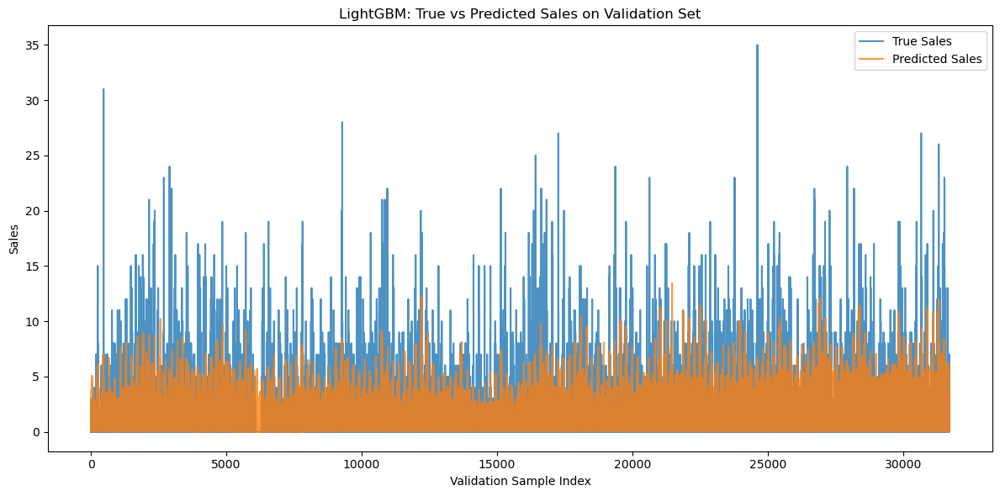

In [408]:
# 获取验证集预测
y_pred = final_model.predict(X_valid)

# 可视化预测 vs 实际
plt.figure(figsize=(12, 6))
plt.plot(y_valid.values, label='True Sales', alpha=0.8)
plt.plot(y_pred, label='Predicted Sales', alpha=0.8)
plt.title("LightGBM: True vs Predicted Sales on Validation Set")
plt.xlabel("Validation Sample Index")
plt.ylabel("Sales")
plt.legend()
plt.tight_layout()
plt.show()

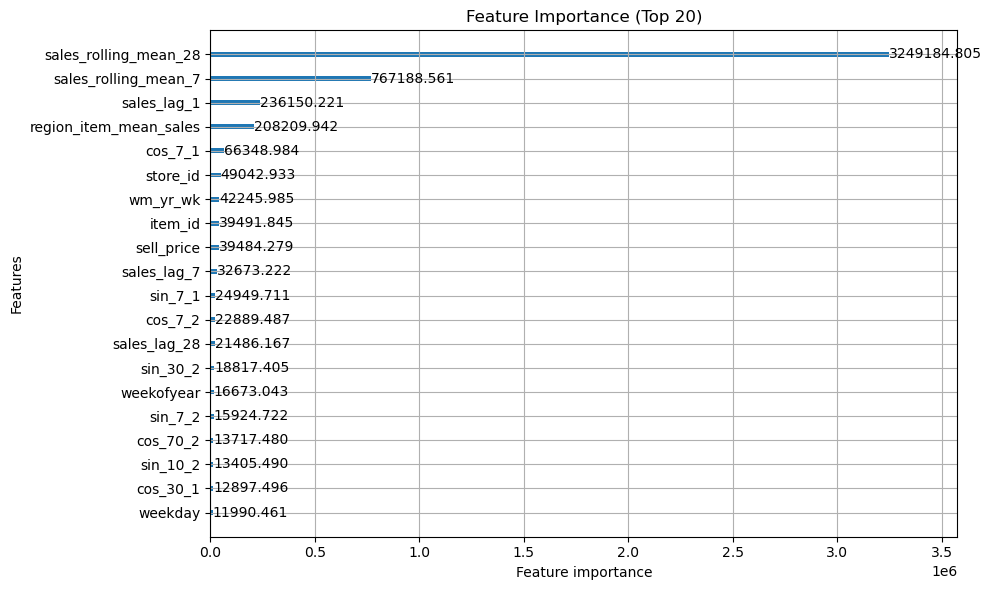

<Figure size 640x480 with 0 Axes>

In [410]:
lgb.plot_importance(final_model, 
                    max_num_features=20, 
                    importance_type='gain', 
                    figsize=(10, 6))
plt.title("Feature Importance (Top 20)")
plt.tight_layout()
plt.show()
plt.savefig("./data/feature_importance_lightgbm.png")

---

In [434]:
# 选择一个商品作为 Prophet 示例（你可以换成其他 item_id）
sample_item = sales_long['item_id'].unique()[0]  # 也可以自己指定某个具体 id

# 筛选该商品的数据
df_prophet = sales_long[sales_long['item_id'] == sample_item][['date', 'sales']].copy()

# Prophet 需要特定的字段名
df_prophet.rename(columns={'date': 'ds', 'sales': 'y'}, inplace=True)

# 按日期排序
df_prophet.sort_values('ds', inplace=True)

df_prophet.head()

,ds,y
9,2011-01-29,15
109,2011-01-29,19
214,2011-01-29,6
323,2011-01-29,5
411,2011-01-29,9


In [435]:
from prophet import Prophet

# 创建 Prophet 模型对象
model = Prophet(
    yearly_seasonality=True,   # 年度季节性（对于食品可能有节日效应）
    weekly_seasonality=True,   # 周季节性（如周末销量高）
    daily_seasonality=False    # 不考虑日内季节性（不适用于天级销售）
)

# 拟合模型（ds: 日期，y: 销量）
model.fit(df_prophet)

04:05:49 - cmdstanpy - INFO - Chain [1] start processing
04:05:53 - cmdstanpy - INFO - Chain [1] done processing


In [436]:
# 生成未来 30 天的日期框架
future = model.make_future_dataframe(periods=30)

# 使用模型进行预测
forecast = model.predict(future)

# 展示预测结果
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(10)

,ds,yhat,yhat_lower,yhat_upper
1933,2016-05-15,5.348790,0.046592,10.820410
1934,2016-05-16,4.789912,-0.570218,10.360858
1935,2016-05-17,4.767250,-0.926727,10.258085
1936,2016-05-18,5.192598,-0.037720,10.582123
1937,2016-05-19,5.360029,-0.158704,10.712054
1938,2016-05-20,5.803084,0.196734,11.352923
1939,2016-05-21,6.375860,1.064943,11.546192
1940,2016-05-22,5.517045,0.188683,10.672573
1941,2016-05-23,4.969177,-0.636743,10.026376
1942,2016-05-24,4.957736,-0.549529,10.622250


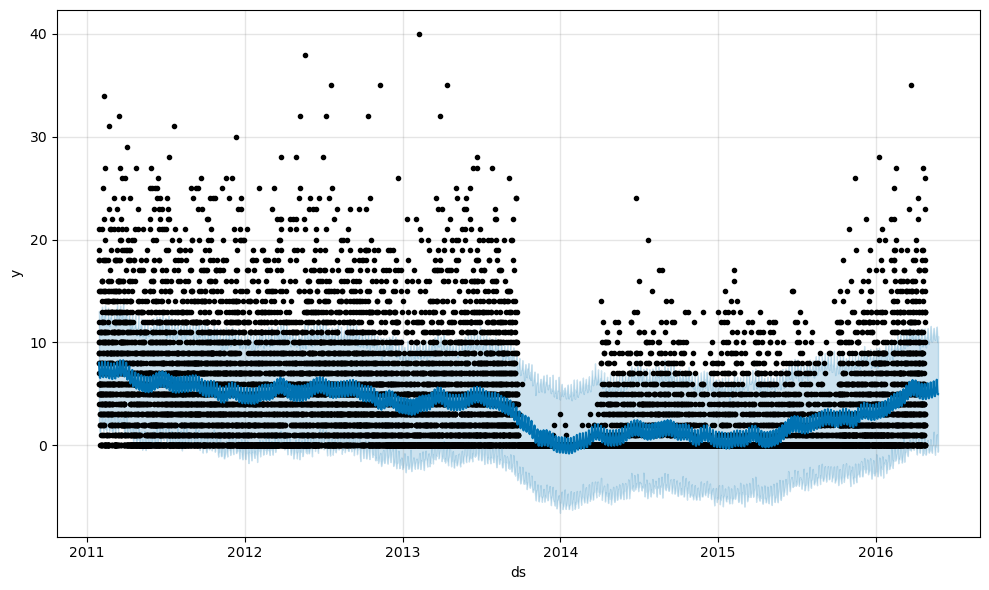

In [437]:
# 预测图：包含历史数据 + 未来预测
model.plot(forecast);

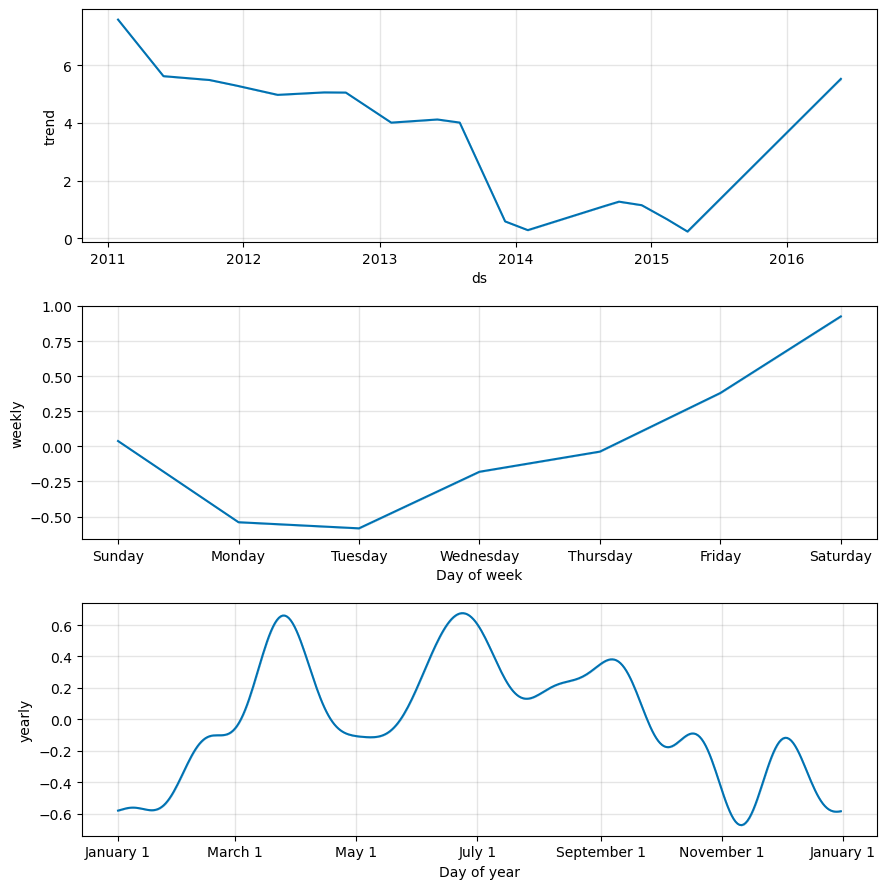

In [438]:
# 显示趋势变化、年度季节性、周季节性等
model.plot_components(forecast);

---

In [445]:
# 筛选某个商品
sample_item = sales_long[sales_long['item_id'] == 1]

# 选择 Prophet 需要的字段
cols = ['date', 'sales', 'sales_rolling_mean_28', 'sales_rolling_mean_7', 'sales_lag_1', 'region_item_mean_sales','snap', 'sell_price']
df_prophet = sample_item[cols].copy()

# 重命名
df_prophet.rename(columns={'date': 'ds', 'sales': 'y'}, inplace=True)

# 检查是否有缺失值
df_prophet.dropna(inplace=True)

In [447]:
# 初始化 Prophet
model = Prophet()

# 添加额外回归变量
model.add_regressor('sales_rolling_mean_28')
model.add_regressor('sales_rolling_mean_7')
model.add_regressor('sales_lag_1')
model.add_regressor('region_item_mean_sales')
model.add_regressor('snap')
model.add_regressor('sell_price')

In [448]:
model.fit(df_prophet)

04:14:49 - cmdstanpy - INFO - Chain [1] start processing
04:14:57 - cmdstanpy - INFO - Chain [1] done processing


In [450]:
df_prophet

,ds,y,sales_rolling_mean_28,sales_rolling_mean_7,sales_lag_1,region_item_mean_sales,snap,sell_price
9,2011-01-29,15,0.000000,0.000000,0.0,0.000000,0,0.97
109,2011-01-29,19,0.000000,0.000000,0.0,0.000000,0,0.97
214,2011-01-29,6,0.000000,0.000000,0.0,0.000000,0,0.97
323,2011-01-29,5,0.000000,0.000000,0.0,0.000000,0,0.97
411,2011-01-29,9,0.000000,0.000000,0.0,0.000000,0,0.97
...,...,...,...,...,...,...,...,...
3529675,2016-04-24,0,3.678571,2.714286,0.0,3.571429,0,0.98
3529891,2016-04-24,3,5.321429,3.428571,2.0,3.464286,0,0.98
3530107,2016-04-24,13,5.142857,4.857143,10.0,4.857143,0,0.88
3530323,2016-04-24,3,5.928571,7.428571,17.0,5.178571,0,0.88


In [451]:
# 构建未来数据框架
future = df_prophet[['ds', 'sales_rolling_mean_28', 'sales_rolling_mean_7', 
                     'sales_lag_1', 'region_item_mean_sales','snap', 'sell_price']].copy()

# 用模型预测
forecast = model.predict(future)

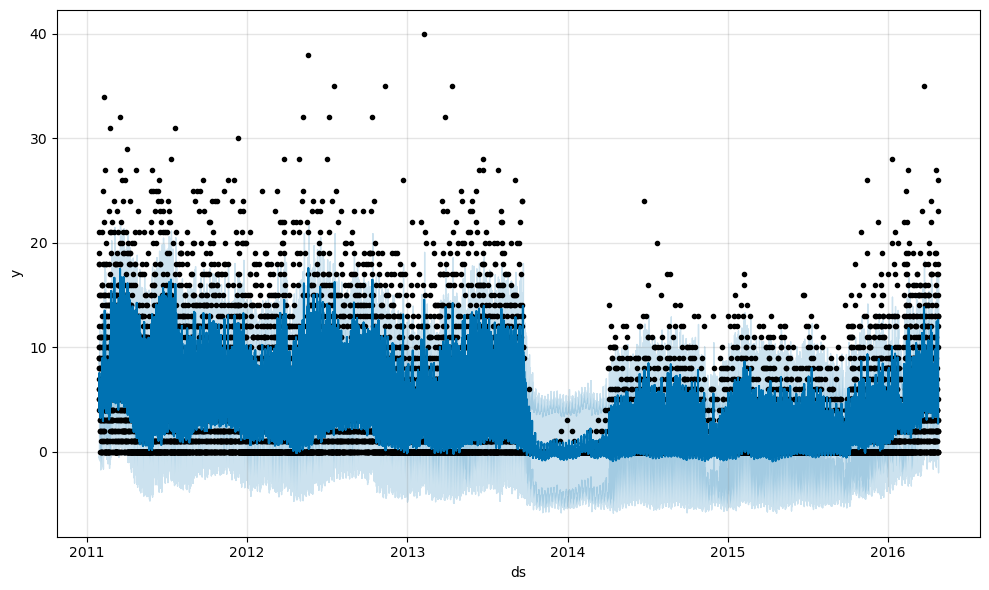

In [454]:
model.plot(forecast);

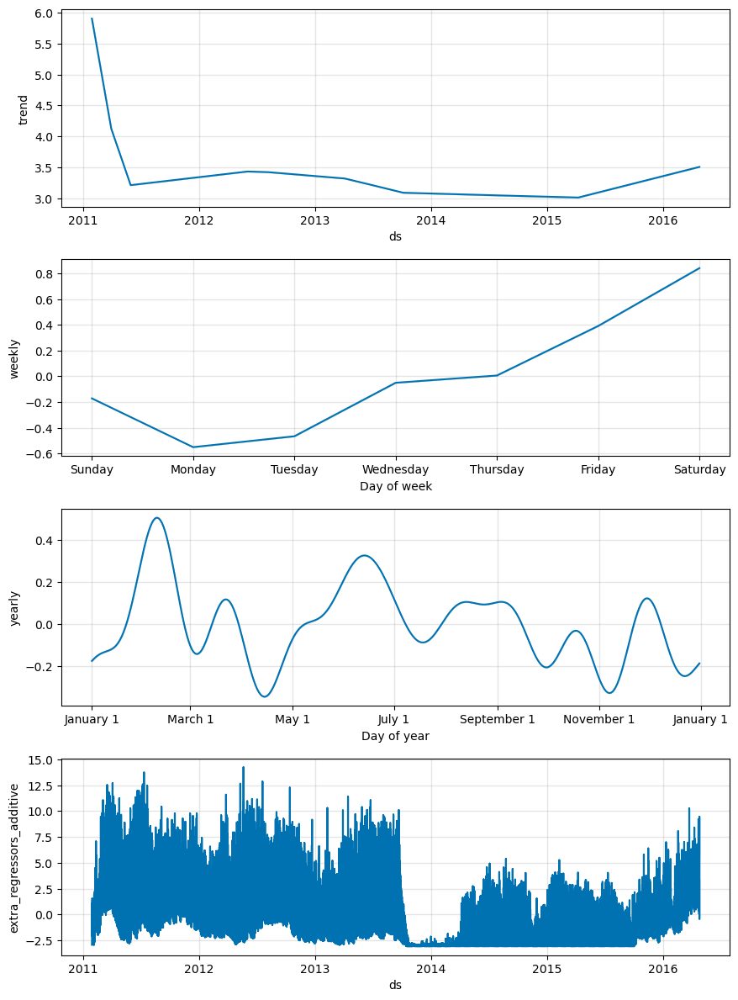

In [455]:
model.plot_components(forecast);

---

In [465]:
sales_long

,Unnamed: 0,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,...,price_change,price_std_7,in_event_window,event_decay,region_item_mean_sales,snap_price_effect,snap_CA,snap_TX,snap_WI,is_event_day
9,1629,FOODS_1_019_CA_1_validation,1,0,0,0,0,15,2011-01-29,11101,...,0.0,0.0,0,0.0,0.000000,0.0,0,0,0,0
15,1650,FOODS_1_040_CA_1_validation,2,0,0,0,0,5,2011-01-29,11101,...,0.0,0.0,0,0.0,0.000000,0.0,0,0,0,0
18,1655,FOODS_1_045_CA_1_validation,3,0,0,0,0,0,2011-01-29,11101,...,0.0,0.0,0,0.0,0.000000,0.0,0,0,0,0
30,1677,FOODS_1_067_CA_1_validation,6,0,0,0,0,8,2011-01-29,11101,...,0.0,0.0,0,0.0,0.000000,0.0,0,0,0,0
66,1753,FOODS_1_144_CA_1_validation,14,0,0,0,0,1,2011-01-29,11101,...,0.0,0.0,0,0.0,0.000000,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3530675,58326086,FOODS_1_156_WI_3_validation,16,0,0,9,2,0,2016-04-24,11613,...,0.0,0.0,0,0.0,0.535714,0.0,0,0,0,0
3530678,58326089,FOODS_1_159_WI_3_validation,17,0,0,9,2,0,2016-04-24,11613,...,0.0,0.0,0,0.0,1.142857,0.0,0,0,0,0
3530684,58326095,FOODS_1_166_WI_3_validation,18,0,0,9,2,1,2016-04-24,11613,...,0.0,0.0,0,0.0,2.035714,0.0,0,0,0,0
3530700,58326111,FOODS_1_182_WI_3_validation,19,0,0,9,2,3,2016-04-24,11613,...,0.0,0.0,0,0.0,1.678571,0.0,0,0,0,0


In [482]:
# 示例商品
sample_item = sales_long[sales_long['item_id'] == 0][['date', 'sales']].copy()

In [483]:
sample_item

,date,sales
315390,2011-10-15,0
315787,2011-10-15,0
316705,2011-10-16,0
317102,2011-10-16,0
318020,2011-10-17,0
...,...,...
3529664,2016-04-24,0
3529880,2016-04-24,0
3530096,2016-04-24,0
3530312,2016-04-24,1


In [484]:
# 设置日期为索引
sample_item['date'] = pd.to_datetime(sample_item['date'])

In [485]:
# 按天频率填充（防止中断）
sample_item = sample_item.groupby('date').agg({'sales': 'sum'}).asfreq('D')

In [487]:
from statsmodels.tsa.stattools import adfuller

# 原始序列 ADF 检验
result = adfuller(sample_item['sales'].dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

if result[1] < 0.05:
    print("时间序列平稳")
else:
    print("不平稳，需要差分")

ADF Statistic: -3.248802866644595
p-value: 0.017327958301962917
时间序列平稳


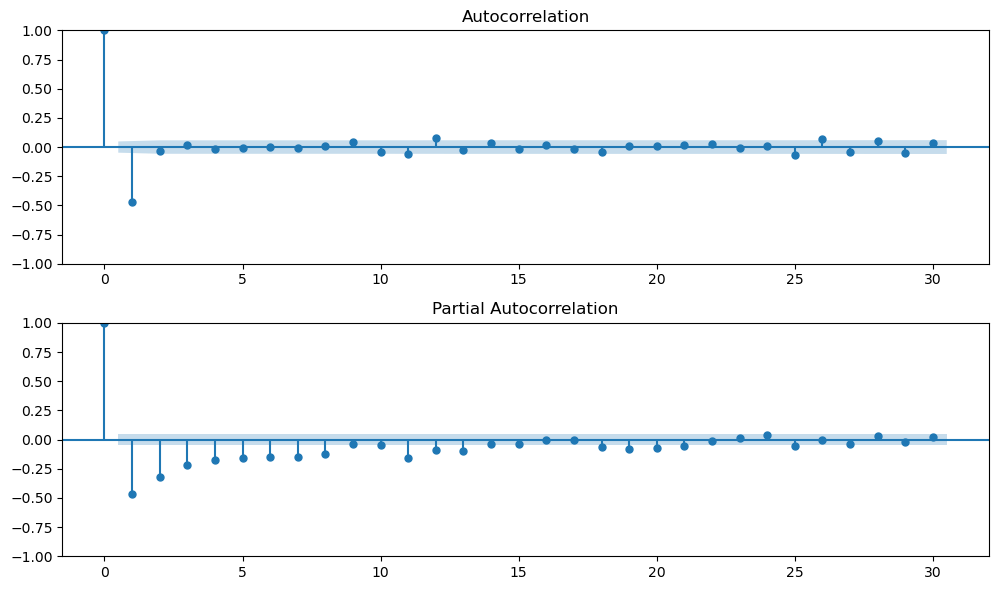

In [490]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# 一阶差分
sales_diff = sample_item['sales'].diff().dropna()

# ACF & PACF 图
fig, ax = plt.subplots(2, 1, figsize=(10, 6))
plot_acf(sales_diff, ax=ax[0], lags=30)
plot_pacf(sales_diff, ax=ax[1], lags=30)
plt.tight_layout()
plt.show()

In [494]:
from statsmodels.tsa.arima.model import ARIMA

# 训练 ARIMA(p, d, q) 模型
model = ARIMA(sample_item['sales'], order=(2, 1, 2)) 
model_fit = model.fit()

# 查看模型摘要
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:                  sales   No. Observations:                 1654
Model:                 ARIMA(2, 1, 2)   Log Likelihood               -3537.774
Date:                Mon, 21 Apr 2025   AIC                           7085.549
Time:                        04:35:23   BIC                           7112.600
Sample:                    10-15-2011   HQIC                          7095.577
                         - 04-24-2016                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9261      0.027    -34.055      0.000      -0.979      -0.873
ar.L2          0.0700      0.025      2.847      0.004       0.022       0.118
ma.L1          0.0592      0.015      3.906      0.0

In [496]:
# 切分最后 30 天做验证集
train = sample_item.iloc[:-30]
valid = sample_item.iloc[-30:]

# 重新训练
model = ARIMA(train['sales'], order=(2, 1, 3))
model_fit = model.fit()

# 预测
preds = model_fit.forecast(steps=30)
rmse = np.sqrt(mean_squared_error(valid['sales'], preds))
print(f'RMSE: {rmse:.4f}')

RMSE: 1.6482


---

In [497]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# SARIMA(p,d,q)(P,D,Q,s) e.g., (1,1,1)(1,0,1,7) for weekly seasonality
model = SARIMAX(sample_item['sales'], order=(2,1,2), seasonal_order=(1,0,1,7))
model_fit = model.fit()
# 查看模型摘要
print(model_fit.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               sales   No. Observations:                 1654
Model:             SARIMAX(2, 1, 2)x(1, 0, [1], 7)   Log Likelihood               -3537.772
Date:                             Mon, 21 Apr 2025   AIC                           7089.545
Time:                                     04:37:05   BIC                           7127.417
Sample:                                 10-15-2011   HQIC                          7103.585
                                      - 04-24-2016                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9262      0.028    -33.366      0.000      -0.981      -0.872
ar.L2          0.0698      

---

In [516]:
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
import torch
import torch.nn as nn
import torch.optim as optim

In [502]:
sales_long.columns

Index(['Unnamed: 0', 'id', 'item_id', 'dept_id', 'cat_id', 'store_id',
       'state_id', 'sales', 'date', 'wm_yr_wk', 'event_name_1', 'sell_price',
       'year', 'month', 'day', 'weekday', 'snap', 'is_weekend', 'weekofyear',
       'dayofmonth', 'is_month_start', 'is_month_end', 'week_of_year',
       'day_of_month', 'sales_lag_1', 'sales_lag_7', 'sales_lag_28', 'sin_7_1',
       'cos_7_1', 'sin_7_2', 'cos_7_2', 'sin_7_3', 'cos_7_3', 'sin_10_1',
       'cos_10_1', 'sin_10_2', 'cos_10_2', 'sin_10_3', 'cos_10_3', 'sin_30_1',
       'cos_30_1', 'sin_30_2', 'cos_30_2', 'sin_30_3', 'cos_30_3', 'sin_70_1',
       'cos_70_1', 'sin_70_2', 'cos_70_2', 'sin_70_3', 'cos_70_3',
       'sales_rolling_mean_7', 'sales_rolling_mean_28', 'price_change',
       'price_std_7', 'in_event_window', 'event_decay',
       'region_item_mean_sales', 'snap_price_effect', 'snap_CA', 'snap_TX',
       'snap_WI', 'is_event_day'],
      dtype='object')

In [503]:
sales_long.head()

,Unnamed: 0,id,item_id,dept_id,cat_id,store_id,state_id,sales,date,wm_yr_wk,...,price_change,price_std_7,in_event_window,event_decay,region_item_mean_sales,snap_price_effect,snap_CA,snap_TX,snap_WI,is_event_day
9,1629,FOODS_1_019_CA_1_validation,1,0,0,0,0,15,2011-01-29,11101,...,0.0,0.0,0,0.0,0.0,0.0,0,0,0,0
15,1650,FOODS_1_040_CA_1_validation,2,0,0,0,0,5,2011-01-29,11101,...,0.0,0.0,0,0.0,0.0,0.0,0,0,0,0
18,1655,FOODS_1_045_CA_1_validation,3,0,0,0,0,0,2011-01-29,11101,...,0.0,0.0,0,0.0,0.0,0.0,0,0,0,0
30,1677,FOODS_1_067_CA_1_validation,6,0,0,0,0,8,2011-01-29,11101,...,0.0,0.0,0,0.0,0.0,0.0,0,0,0,0
66,1753,FOODS_1_144_CA_1_validation,14,0,0,0,0,1,2011-01-29,11101,...,0.0,0.0,0,0.0,0.0,0.0,0,0,0,0


In [504]:
drop_cols = ['Unnamed: 0', 'id', 'dept_id', 'cat_id', 'date', 'sales', 'event_name_1']
features = [col for col in sales_long.columns if col not in drop_cols]

In [505]:
# 丢掉缺失值
df_model = sales_long[features].dropna().copy()

In [506]:
df_model.shape

(315770, 56)

In [507]:
# 标准化
scaler = MinMaxScaler()
scaled = scaler.fit_transform(df_model)

In [508]:
# 构造滑动窗口数据
def create_sequences(data, seq_len=28):
    X, y = [], []
    for i in range(len(data) - seq_len):
        X.append(data[i:i+seq_len])
        y.append(data[i+seq_len][0])  # 预测 sales
    return np.array(X), np.array(y)

In [509]:
seq_len = 28
X, y = create_sequences(scaled, seq_len)

In [510]:
# 划分训练测试集
split_idx = int(len(X) * 0.8)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

In [513]:
# 转为 tensor
X_train = torch.tensor(X_train, dtype=torch.float32)
y_train = torch.tensor(y_train, dtype=torch.float32).unsqueeze(-1)
X_test = torch.tensor(X_test, dtype=torch.float32)
y_test = torch.tensor(y_test, dtype=torch.float32).unsqueeze(-1)

In [514]:
# 数据加载器
train_loader = DataLoader(TensorDataset(X_train, y_train), batch_size=64, shuffle=True)

In [517]:
class GRUNet(nn.Module):
    def __init__(self, input_size, hidden_size=64, num_layers=2):
        super(GRUNet, self).__init__()
        self.gru = nn.GRU(input_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, 1)

    def forward(self, x):
        out, _ = self.gru(x)
        out = self.fc(out[:, -1, :])  # 只取最后一个时间步
        return out

In [520]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [521]:
model = GRUNet(input_size=X_train.shape[2]).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [523]:
# 训练过程
epochs = 30
for epoch in range(epochs):
    model.train()
    epoch_loss = 0
    for X_batch, y_batch in train_loader:
        X_batch, y_batch = X_batch.to(device), y_batch.to(device)
        optimizer.zero_grad()
        pred = model(X_batch)
        loss = criterion(pred, y_batch)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    print(f"Epoch {epoch+1}/{epochs} - Loss: {epoch_loss / len(train_loader):.6f}")

Epoch 1/30 - Loss: 0.000349
Epoch 2/30 - Loss: 0.000281
Epoch 3/30 - Loss: 0.000268
Epoch 4/30 - Loss: 0.000216
Epoch 5/30 - Loss: 0.000184
Epoch 6/30 - Loss: 0.000185
Epoch 7/30 - Loss: 0.000181
Epoch 8/30 - Loss: 0.000166
Epoch 9/30 - Loss: 0.000140
Epoch 10/30 - Loss: 0.000160
Epoch 11/30 - Loss: 0.000127
Epoch 12/30 - Loss: 0.000071
Epoch 13/30 - Loss: 0.000152
Epoch 14/30 - Loss: 0.000090
Epoch 15/30 - Loss: 0.000100
Epoch 16/30 - Loss: 0.000046
Epoch 17/30 - Loss: 0.000106
Epoch 18/30 - Loss: 0.000126
Epoch 19/30 - Loss: 0.000097
Epoch 20/30 - Loss: 0.000046
Epoch 21/30 - Loss: 0.000076
Epoch 22/30 - Loss: 0.000090
Epoch 23/30 - Loss: 0.000033
Epoch 24/30 - Loss: 0.000041
Epoch 25/30 - Loss: 0.000075
Epoch 26/30 - Loss: 0.000074
Epoch 27/30 - Loss: 0.000055
Epoch 28/30 - Loss: 0.000071
Epoch 29/30 - Loss: 0.000100
Epoch 30/30 - Loss: 0.000090


In [ ]:
model.eval()
with torch.no_grad():
    y_pred = model(X_test.to(device)).squeeze().cpu().numpy()
    y_true = y_test.squeeze().numpy()

# 反归一化
sales_index = features.index('sales')

y_pred_inv = scaler.inverse_transform(
    np.concatenate([y_pred.reshape(-1,1), np.zeros((len(y_pred), len(features)-1))], axis=1)
)[:, sales_index]

y_true_inv = scaler.inverse_transform(
    np.concatenate([y_true.reshape(-1,1), np.zeros((len(y_true), len(features)-1))], axis=1)
)[:, sales_index]

# 画图
plt.figure(figsize=(12, 5))
plt.plot(y_true_inv, label='True')
plt.plot(y_pred_inv, label='Predicted')
plt.legend()
plt.title('GRU预测效果（未来天数）')
plt.show()